# Autoimmune GWAS genes vs perturb-seq clusters analysis

OpenTargets autoimmune disease enrichment analysis.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import anndata
from scipy.stats import fisher_exact
from statsmodels.stats.multitest import multipletests
from sklearn.metrics import precision_recall_curve, auc, average_precision_score

from itertools import combinations
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

mpl.rcParams['pdf.fonttype'] = 42  # Embed fonts as TrueType
mpl.rcParams['svg.fonttype'] = 'none'  # Embed fonts as TrueType
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans']
plt.rcParams['figure.autolayout'] = True
plt.rcParams['figure.dpi'] = 300  # or 150, 200, etc.
plt.rcParams['savefig.dpi'] = 600

# Increase all font sizes
plt.rcParams['font.size'] = 16  # Base font size
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
plt.rcParams['legend.fontsize'] = 15

import sys
sys.path.append('../../3_DE_analysis/')
from DE_analysis_utils import *

In [ ]:
import yaml
with open('../../../metadata/figure_palettes.yaml', 'r') as f:
    palettes = yaml.safe_load(f)

In [3]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Your colors
colors = palettes['culture_condition']

# Create continuous colormaps from white to each color
condition_colormaps = {}
for name, color in colors.items():
    condition_colormaps[name] = mcolors.LinearSegmentedColormap.from_list(
        f'{name}', ['white', color]
    )

# # Visualize the colormaps
# fig, axes = plt.subplots(3, 1, figsize=(8, 4))
# gradient = np.linspace(0, 1, 256).reshape(1, -1)

# for ax, (name, cmap) in zip(axes, condition_colormaps.items()):
#     ax.imshow(gradient, aspect='auto', cmap=cmap)
#     ax.set_title(f'White to {name}', fontsize=12)
#     ax.set_xticks([])
#     ax.set_yticks([])

# plt.tight_layout()
# plt.show()

## Load Data

In [4]:
datadir = '/mnt/oak/users/emma/data/GWT/CD4i_final/'
adata_de = sc.read_h5ad(datadir + f'/DE_results_all_confounders/CD4i_final.merged_DE_results.h5ad')
adata_de.layers['zscore'] = adata_de.layers['log_fc'] / adata_de.layers['lfcSE']
adata_de.layers['zscore'][np.where(adata_de.layers['zscore'] > 50)] = 50

# Filter very lowly expressed genes
base_mean_df = sc.get.obs_df(adata_de, adata_de.var_names.tolist() + ['culture_condition', 'chunk'], layer='baseMean')
base_mean_df = base_mean_df.drop_duplicates().sort_values('culture_condition')

# Calculate for Rest condition
base_mean_rest = base_mean_df[base_mean_df['culture_condition'] == 'Rest'].set_index('chunk').drop('culture_condition', axis=1).T
adata_de.var['mean_baseMean_Rest'] = base_mean_rest.mean(1).fillna(0)
adata_de.var['std_baseMean_Rest'] = base_mean_rest.std(1).fillna(10000)

# Calculate for Stim8hr condition
base_mean_stim8 = base_mean_df[base_mean_df['culture_condition'] == 'Stim8hr'].set_index('chunk').drop('culture_condition', axis=1).T
adata_de.var['mean_baseMean_Stim8hr'] = base_mean_stim8.mean(1).fillna(0)
adata_de.var['std_baseMean_Stim8hr'] = base_mean_stim8.std(1).fillna(10000)

# Calculate for Stim48hr condition
base_mean_stim48 = base_mean_df[base_mean_df['culture_condition'] == 'Stim48hr'].set_index('chunk').drop('culture_condition', axis=1).T
adata_de.var['mean_baseMean_Stim48hr'] = base_mean_stim48.mean(1).fillna(0)
adata_de.var['std_baseMean_Stim48hr'] = base_mean_stim48.std(1).fillna(10000)

# Exclude from analysis genes with very low base mean (messing up reliability estimate)
gs_mask = (adata_de.var['mean_baseMean_Rest'] > 0.1) & (adata_de.var['mean_baseMean_Stim8hr'] > 0.1) & (adata_de.var['mean_baseMean_Stim48hr'] > 0.1)
adata_de = adata_de[:, gs_mask].copy()
sum(~gs_mask)

3677

In [5]:
adata_de_corr = anndata.experimental.read_lazy(datadir + f'/DE_results_all_confounders/CD4i_final.merged_DE_results_corrected.h5ad')
target_contrast_correction_dict = dict(zip(adata_de_corr.obs.to_dataframe()['target_contrast'], adata_de_corr.obs.to_dataframe()['target_contrast_corrected']))
target_contrast_name_correction_dict = dict(zip(adata_de_corr.obs.to_dataframe()['target_contrast_gene_name'], adata_de_corr.obs.to_dataframe()['target_contrast_gene_name_corrected']))

adata_de.obs['target_contrast_gene_name'] = adata_de.obs['target_contrast_gene_name'].map(target_contrast_name_correction_dict)
adata_de.obs['target_contrast'] = adata_de.obs['target_contrast'].map(target_contrast_correction_dict)

# remove missing perturb
adata_de = adata_de[~adata_de.obs['target_contrast_gene_name'].isna()].copy()

In [6]:
adata_de.var_names = adata_de.var['gene_name'].values

In [7]:
de_summary_stats = pd.read_csv('/mnt/oak/users/emma/data/GWT/CD4i_final/DE_results_all_confounders/DE_summary_stats_per_target_corrected.csv')

In [ ]:
donor_robustness_summary = pd.read_csv('../../3_DE_analysis/results/DE_donor_robustness_correlation_summary.csv', index_col=0)
guide_robustness_summary = pd.read_csv('../../3_DE_analysis/results/DE_by_guide.correlation_results.csv')

In [15]:
# All clustered perturbations
cl_a = anndata.experimental.read_lazy('/mnt/oak/users/emma/data/GWT//CD4i_final/nde75ntotal50_varfiltered_simple_clustering.h5ad')
clustering_df = cl_a.obs.to_dataframe()[['hdbscan', 'target_contrast_gene_name_corrected']]

# # Consider only clusters with at least 5 genes
keep_clusters = clustering_df[clustering_df.groupby('hdbscan')['target_contrast_gene_name_corrected'].transform('nunique') >= 5].hdbscan.unique()
keep_clusters = [x for x in keep_clusters if x != -1]
clustering_df = clustering_df[clustering_df['hdbscan'].isin(keep_clusters)]
clustering_df['hdbscan'].nunique()

77

In [10]:
# Load disease-gene associations (see download_disease_genes.py)
disease_gene_df = pd.read_csv('disease_gene_associations_detailed.csv')
neg_ctrl_diseases = ['coronary artery disease', 'age-related macular degeneration', 'chronic kidney disease']

disease_gene_df['disease_name'].unique()
disease_gene_df.head()

,disease_efo,disease_name,gene_symbol,gene_id,gene_name,association_score,genetic_evidence_score,genetic_evidence_types
0,EFO_0000384,Crohn's disease,IL23R,ENSG00000162594,interleukin 23 receptor,0.566665,0.919212,genetic_association
1,EFO_0000384,Crohn's disease,NOD2,ENSG00000167207,nucleotide binding oligomerization domain cont...,0.762496,0.912953,genetic_association
2,EFO_0000384,Crohn's disease,PTPN22,ENSG00000134242,protein tyrosine phosphatase non-receptor type 22,0.536027,0.872400,genetic_association
3,EFO_0000384,Crohn's disease,GPR35,ENSG00000178623,G protein-coupled receptor 35,0.535955,0.863475,genetic_association
4,EFO_0000384,Crohn's disease,TNFSF15,ENSG00000181634,TNF superfamily member 15,0.530817,0.862183,genetic_association


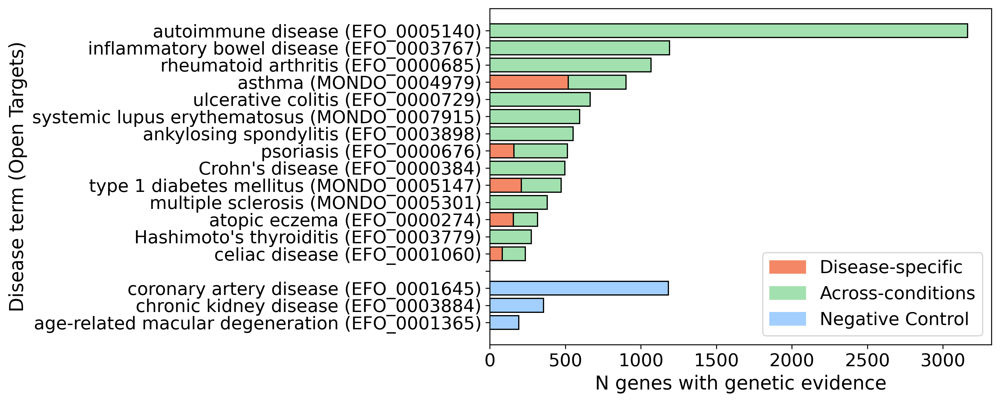

In [ ]:
import matplotlib.pyplot as plt

# Count number of genes per disease
disease_counts = disease_gene_df['disease_name'].value_counts().sort_values(ascending=False)

# Map from disease_name to EFO for display
disease_name2efo = disease_gene_df.groupby('disease_name')['disease_efo'].first().to_dict()
def disease_label(name):
    efo = disease_name2efo.get(name, '')
    return f"{name} ({efo})" if efo else name

# Separate autoimmune and negative control diseases
autoimmune_diseases = [d for d in disease_counts.index if d not in neg_ctrl_diseases]
neg_ctrl_counts = disease_counts[disease_counts.index.isin(neg_ctrl_diseases)]

# Keep the "autoimmune disease" global category separately
autoimmune_global = "autoimmune disease"

# For each autoimmune disease, count how many associated genes are also in "autoimmune disease"
autoimmune_condition_genes = set(disease_gene_df[disease_gene_df['disease_name'] == autoimmune_global]['gene_name'])
autoimmune_stacked = []
shared_with_autoimmune = []
not_shared_with_autoimmune = []

for disease in autoimmune_diseases:
    disease_genes = set(disease_gene_df[disease_gene_df['disease_name'] == disease]['gene_name'])
    shared = len(disease_genes & autoimmune_condition_genes)
    not_shared = len(disease_genes - autoimmune_condition_genes)
    shared_with_autoimmune.append(shared)
    not_shared_with_autoimmune.append(not_shared)
    autoimmune_stacked.append(disease)

# Bar positions
y_autoimmune = range(len(autoimmune_diseases))
y_negctrl = range(len(autoimmune_diseases) + 1, len(autoimmune_diseases) + 1 + len(neg_ctrl_counts))

fig, ax = plt.subplots(figsize=(12, 5))

# Plot stacked bars for autoimmune diseases
bar1 = ax.barh(y_autoimmune, not_shared_with_autoimmune, color='#F48866', edgecolor='black', label='Unique autoimmune genes')
bar2 = ax.barh(y_autoimmune, shared_with_autoimmune, left=not_shared_with_autoimmune, color='#A2E1AF', edgecolor='black', label='Also in general autoimmune disease')

# Plot bars for negative controls
negctrl_gene_counts = neg_ctrl_counts.values
bar3 = ax.barh(y_negctrl, negctrl_gene_counts, color='#A2CFFE', edgecolor='black', label='Negative Control')

# Y-tick labels (with EFO)
autoimmune_disease_labels = [disease_label(d) for d in autoimmune_diseases]
negctrl_labels = [disease_label(d) for d in neg_ctrl_counts.index]
all_labels = autoimmune_disease_labels + [''] + negctrl_labels
ax.set_yticks(range(len(all_labels)))
ax.set_yticklabels(all_labels)

# Legend proxies
from matplotlib.patches import Patch
legend_handles = [
    Patch(color='#F48866', label='Disease-specific'),
    Patch(color='#A2E1AF', label='Across-conditions'),
    Patch(color='#A2CFFE', label='Negative Control')
]
ax.legend(handles=legend_handles, loc='best')

ax.set_xlabel("N genes with genetic evidence")
ax.set_ylabel("Disease term (Open Targets)")
# ax.set_title("Number of genes per disease (autoimmune vs negative control)\nGreen = also in general autoimmune category")
plt.gca().invert_yaxis()  # Largest at top

plt.tight_layout()
plt.savefig('../results/GWAS_autoimmune_n_genes.pdf')
plt.show()

## Enrichment of disease-associated genes

In [39]:
from scipy.stats.contingency import odds_ratio
from scipy.stats import fisher_exact
import pandas as pd
import numpy as np

def get_enrichment(cl_genes, disease_genes, background_genes):
    # Create contingency table
    # Convert lists to sets for set operations
    cl_genes_set = set(cl_genes)
    disease_genes_set = set(disease_genes)
    
    in_cluster_in_disease = len(cl_genes_set & disease_genes_set)
    in_cluster_not_disease = len(cl_genes_set - disease_genes_set)
    not_cluster_in_disease = len(disease_genes_set - cl_genes_set)
    not_cluster_not_disease = len(background_genes - cl_genes_set - disease_genes_set)
        
    contingency_table = np.array([
        [in_cluster_in_disease, not_cluster_in_disease],
        [in_cluster_not_disease, not_cluster_not_disease]
    ])

    # Calculate statistics
    or_res = odds_ratio(contingency_table)
    oratio = or_res.statistic
    _, p_value = fisher_exact(contingency_table, alternative='greater')
    or_ci = or_res.confidence_interval(confidence_level=0.95)
    
    # Create results dataframe
    results = pd.DataFrame({
        'odds_ratio': [oratio],
        'p_value': [p_value], 
        'ci_low': [or_ci.low],
        'ci_high': [or_ci.high],
        'cluster_size':[len(cl_genes_set)],
        'in_cluster_in_disease': [in_cluster_in_disease],
        'in_cluster_not_disease': [in_cluster_not_disease],
        'not_cluster_in_disease': [not_cluster_in_disease],
        'not_cluster_not_disease': [not_cluster_not_disease],
        'intersecting_genes': [list(cl_genes_set & disease_genes_set)]
    })
    
    return results

### Upstream regulators

In [40]:
background_genes = set(de_summary_stats[(de_summary_stats.n_total_de_genes>75)&(de_summary_stats.n_cells_target>50)].target_name_corrected.unique())
print(len(background_genes))

1860


In [41]:

# Get background genes for this analysis (all genes used for clustegin)
background_genes = set(de_summary_stats[(de_summary_stats.n_total_de_genes>75)&(de_summary_stats.n_cells_target>50)].target_name_corrected.unique())

# Filter clusters by minimum size
test_disease_gene_df = disease_gene_df[disease_gene_df.gene_symbol.isin(background_genes)].copy()

# Initialize empty list to store results
all_results = []
hg_all_results = []

for cl in clustering_df['hdbscan'].unique():
    test_clustering_df = clustering_df[clustering_df['hdbscan'] == cl].copy()
    cl_genes = set(test_clustering_df['target_contrast_gene_name_corrected'].unique())
    for d in test_disease_gene_df.disease_name.unique():
        disease_genes = test_disease_gene_df[test_disease_gene_df.disease_name == d].gene_symbol
        # Get enrichment results for this cluster-disease pair
        # Only run enrichment if overlap > 1
        overlap = len(cl_genes & set(disease_genes))
        if overlap > 0:
            result_df = get_enrichment(cl_genes,
                                     disease_genes, 
                                     background_genes)

            # Add cluster and disease info
            result_df['cluster'] = cl
            result_df['disease'] = d
            all_results.append(result_df)
        else:
            result_df = pd.DataFrame({
                'odds_ratio': [np.nan],
                'p_value': [1.0],
                'ci_low': [np.nan],
                'ci_high': [np.nan],
                'cluster_size': [len(cl_genes)],
                'in_cluster_in_disease': [np.nan],
                'in_cluster_not_disease': [np.nan],
                'not_cluster_in_disease': [np.nan],
                'not_cluster_not_disease': [np.nan],
                'intersecting_genes': [list(cl_genes & set(disease_genes))]
            })
            result_df['cluster'] = cl
            result_df['disease'] = d
            all_results.append(result_df)



# Concatenate all results into single dataframe        
enrichment_results = pd.concat(all_results, ignore_index=True)

# Run BH correction for each cluster separately
enrichment_results['p_adj_fdr'] = 1.0  # Initialize with 1.0
for cluster in enrichment_results['cluster'].unique():
    mask = enrichment_results['cluster'] == cluster
    enrichment_results.loc[mask, 'p_adj_fdr'] = multipletests(enrichment_results.loc[mask, 'p_value'], method='fdr_bh')[1]


In [42]:
enrichment_results.sort_values('p_adj_fdr')[0:20]

,odds_ratio,p_value,ci_low,ci_high,cluster_size,in_cluster_in_disease,in_cluster_not_disease,not_cluster_in_disease,not_cluster_not_disease,intersecting_genes,cluster,disease,p_adj_fdr
1088,58.173477,0.000019,8.162206,654.620158,6,4.0,2.0,61.0,1793.0,"[IRF4, BATF, STAT3, IPMK]",79,Crohn's disease,0.000329
1098,24.005573,0.000483,3.407345,267.519245,6,4.0,2.0,142.0,1712.0,"[IRF4, BATF, STAT3, IPMK]",79,inflammatory bowel disease,0.002738
1093,38.062949,0.000346,4.968082,291.736927,6,3.0,3.0,47.0,1807.0,"[IRF4, BATF, STAT3]",79,atopic eczema,0.002738
1100,26.898476,0.000903,3.536026,204.658011,6,3.0,3.0,66.0,1788.0,"[IRF4, STAT3, IPMK]",79,psoriasis,0.003836
1099,16.892724,0.011934,1.497347,120.845560,6,2.0,4.0,53.0,1801.0,"[BATF, STAT3]",79,multiple sclerosis,0.034988
1094,8.954787,0.012349,1.277477,99.372986,6,4.0,2.0,338.0,1516.0,"[IRF4, BATF, STAT3, IPMK]",79,autoimmune disease,0.034988
1104,11.651354,0.023339,1.038886,82.739688,6,2.0,4.0,76.0,1778.0,"[STAT3, IPMK]",79,ulcerative colitis,0.056680
103,3.048065,0.003560,1.362276,6.334189,195,11.0,184.0,32.0,1633.0,"[PTPRC, RAD51B, FOXO1, PRKCQ, IRF4, CREBBP, AN...",99,Hashimoto's thyroiditis,0.060521
536,3.658074,0.004180,1.412011,8.447037,36,8.0,28.0,132.0,1692.0,"[OSR1, CCND2, CYP4V2, SFTPC, MSL2, SUPT4H1, HH...",105,coronary artery disease,0.071059
830,4.545958,0.004182,1.510080,11.445978,41,6.0,35.0,66.0,1753.0,"[IMMP1L, FAM20B, EGR2, LRRC25, FLI1, KLF2]",80,systemic lupus erythematosus,0.071092


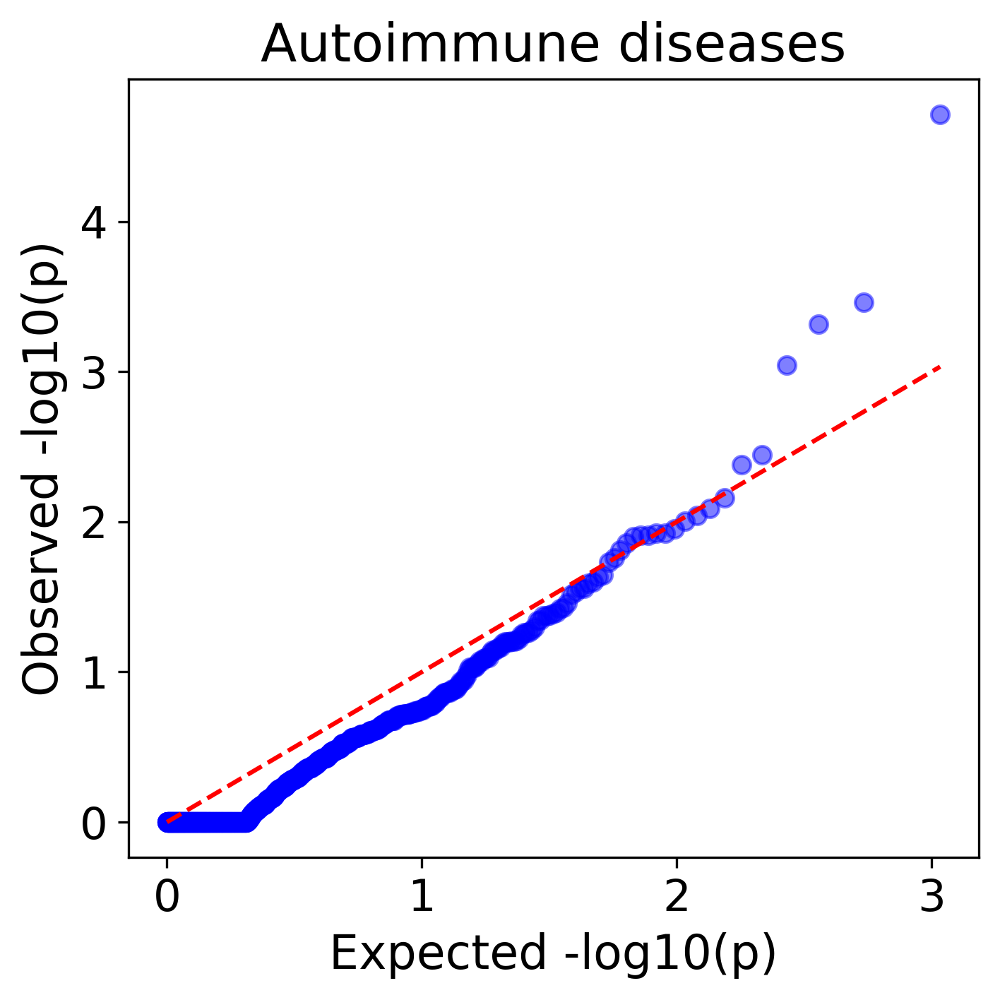

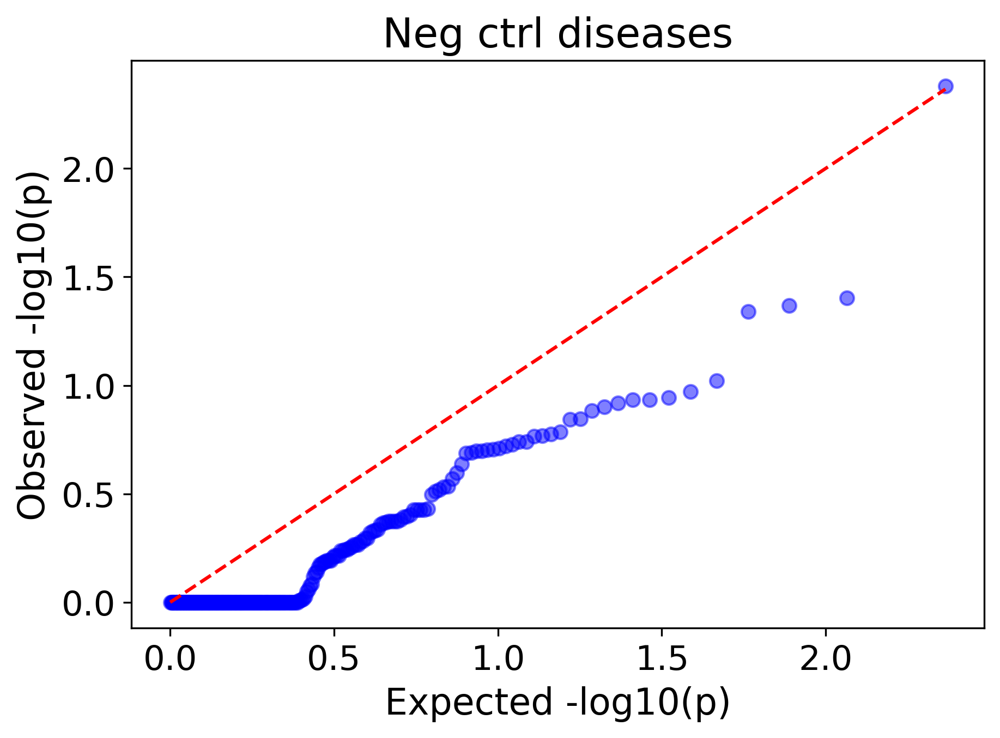

In [43]:
# Create QQ plot for all p-values across all diseases
plt.figure(figsize=(5, 5))

# Sort all p-values 
all_p_values = enrichment_results[~enrichment_results.disease.isin(neg_ctrl_diseases)]['p_value']
observed_p = -np.log10(sorted(all_p_values))
expected_p = -np.log10(np.linspace(0, 1, len(observed_p)+2)[1:-1])

# Plot scatter 
plt.scatter(expected_p, observed_p, alpha=0.5, color='blue')

# Plot diagonal line
plt.plot([0, max(expected_p)], [0, max(expected_p)], 'r--')

plt.xlabel('Expected -log10(p)')
plt.ylabel('Observed -log10(p)') 
plt.title('Autoimmune diseases')
plt.tight_layout()
plt.show()

all_p_values = enrichment_results[enrichment_results.disease.isin(neg_ctrl_diseases)]['p_value']
observed_p = -np.log10(sorted(all_p_values))
expected_p = -np.log10(np.linspace(0, 1, len(observed_p)+2)[1:-1])

# Plot scatter 
plt.scatter(expected_p, observed_p, alpha=0.5, color='blue')

# Plot diagonal line
plt.plot([0, max(expected_p)], [0, max(expected_p)], 'r--')

plt.xlabel('Expected -log10(p)')
plt.ylabel('Observed -log10(p)') 
plt.title('Neg ctrl diseases')
plt.tight_layout()
plt.show()

In [44]:
enrichment_df = enrichment_results.copy()

### Downstream genes

In [45]:
# Get one df_downstream table for each culture condition and run enrichment analysis on top downstream genes in each condition separately

# Read full table, filter out assignment rows and low upstream
df_downstream_full = pd.read_csv(
    '/mnt/oak/users/emma/data/GWT/CD4i_final/nde75ntotal50_varfiltered_simple_clustering_downstream_genes.csv', 
    index_col=0
)
df_downstream_full = df_downstream_full[df_downstream_full['condition'] != 'condition_in_cluster']
df_downstream_full = df_downstream_full[df_downstream_full['num_of_upstream'] > 1]

# Get unique experimental culture conditions
culture_conditions = df_downstream_full['condition'].unique()

# Store enrichment results for all conditions
enrichment_results_all = []

for cond in culture_conditions:
    # Make condition-specific df_downstream
    df_downstream = df_downstream_full[df_downstream_full['condition'] == cond].copy()
    
    # Get top 50 by negative/positive zscore within each hdbscan cluster
    df_top_neg = df_downstream.groupby('hdbscan_cluster', group_keys=False).apply(
        lambda x: x.nsmallest(50, ['zscore_rank_negative_regulation'], keep='all')
    )
    df_top_pos = df_downstream.groupby('hdbscan_cluster', group_keys=False).apply(
        lambda x: x.nsmallest(50, ['zscore_rank_positive_regulation'], keep='all')
    )
    df_downstream_top = pd.concat([df_top_neg, df_top_pos])
    df_downstream_top = df_downstream_top[df_downstream_top['hdbscan_cluster'].isin(keep_clusters)]
    
    # Define background for enrichment in this condition
    background_genes = set(df_downstream_top.downstream_gene.unique())
    test_disease_gene_df = disease_gene_df[disease_gene_df.gene_symbol.isin(background_genes)].copy()
    
    # Enrichment cluster × disease for this condition
    all_results = []
    for cl in df_downstream_top['hdbscan_cluster'].unique():
        cl_genes = set(df_downstream_top[df_downstream_top['hdbscan_cluster'] == cl]['downstream_gene'].unique())
        for d in test_disease_gene_df.disease_name.unique():
            disease_genes = set(test_disease_gene_df[test_disease_gene_df.disease_name == d].gene_symbol)
            overlap = len(cl_genes & disease_genes)
            if overlap > 0:
                result_df = get_enrichment(cl_genes, disease_genes, background_genes)
                result_df['cluster'] = cl
                result_df['disease'] = d
                result_df['condition'] = cond
                all_results.append(result_df)
            else:
                result_df = pd.DataFrame({
                    'odds_ratio': [np.nan],
                    'p_value': [1.0],
                    'ci_low': [np.nan],
                    'ci_high': [np.nan],
                    'cluster_size': [len(cl_genes)],
                    'in_cluster_in_disease': [np.nan],
                    'in_cluster_not_disease': [np.nan],
                    'not_cluster_in_disease': [np.nan],
                    'not_cluster_not_disease': [np.nan],
                    'intersecting_genes': [list(cl_genes & set(disease_genes))]
                })
                result_df['cluster'] = cl
                result_df['disease'] = d
                result_df['condition'] = cond
                all_results.append(result_df)

    
    # Multiple testing correction per cluster for this condition
    if all_results:
        enrichment_results = pd.concat(all_results, ignore_index=True)
        enrichment_results['p_adj_fdr'] = 1.0
        for cluster in enrichment_results['cluster'].unique():
            mask = enrichment_results['cluster'] == cluster
            enrichment_results.loc[mask, 'p_adj_fdr'] = multipletests(
                enrichment_results.loc[mask, 'p_value'], method='fdr_bh'
            )[1]
        enrichment_results_all.append(enrichment_results)

# Combine enrichment results across all conditions
if enrichment_results_all:
    enrichment_results = pd.concat(enrichment_results_all, ignore_index=True)
else:
    enrichment_results = pd.DataFrame()

In [46]:
enrichment_results.sort_values('p_adj_fdr').head()

,odds_ratio,p_value,ci_low,ci_high,cluster_size,in_cluster_in_disease,in_cluster_not_disease,not_cluster_in_disease,not_cluster_not_disease,intersecting_genes,cluster,disease,condition,p_adj_fdr
2301,3.040523,2.970369e-07,1.969155,4.656896,100,41.0,59.0,591.0,2587.0,"[TMEM50A, ATP8B4, PHLDA1, TYMP, UBASH3B, TRAT1...",89,autoimmune disease,Stim8hr,0.000005
2588,20.424028,2.924264e-06,5.526675,82.341144,12,7.0,5.0,209.0,3057.0,"[ITK, EAF2, CHD7, ZBTB25, EGR2, NFKBIA, ADO]",110,asthma,Stim8hr,0.000050
816,4.650952,7.218316e-06,2.408148,8.466731,100,15.0,85.0,102.0,2691.0,"[PRKCB, PTPN22, PGAP3, MSRA, IKZF1, B3GNT2, BC...",78,Crohn's disease,Rest,0.000123
2589,24.268942,1.446683e-05,5.958757,90.715725,12,5.0,7.0,93.0,3173.0,"[CHD7, ZBTB25, EGR2, NFKBIA, ADO]",110,atopic eczema,Stim8hr,0.000123
2596,17.601369,6.192757e-05,4.342954,65.433768,12,5.0,7.0,127.0,3139.0,"[MAP3K8, CHD7, EGR2, NFKBIA, ADO]",110,psoriasis,Stim8hr,0.000263


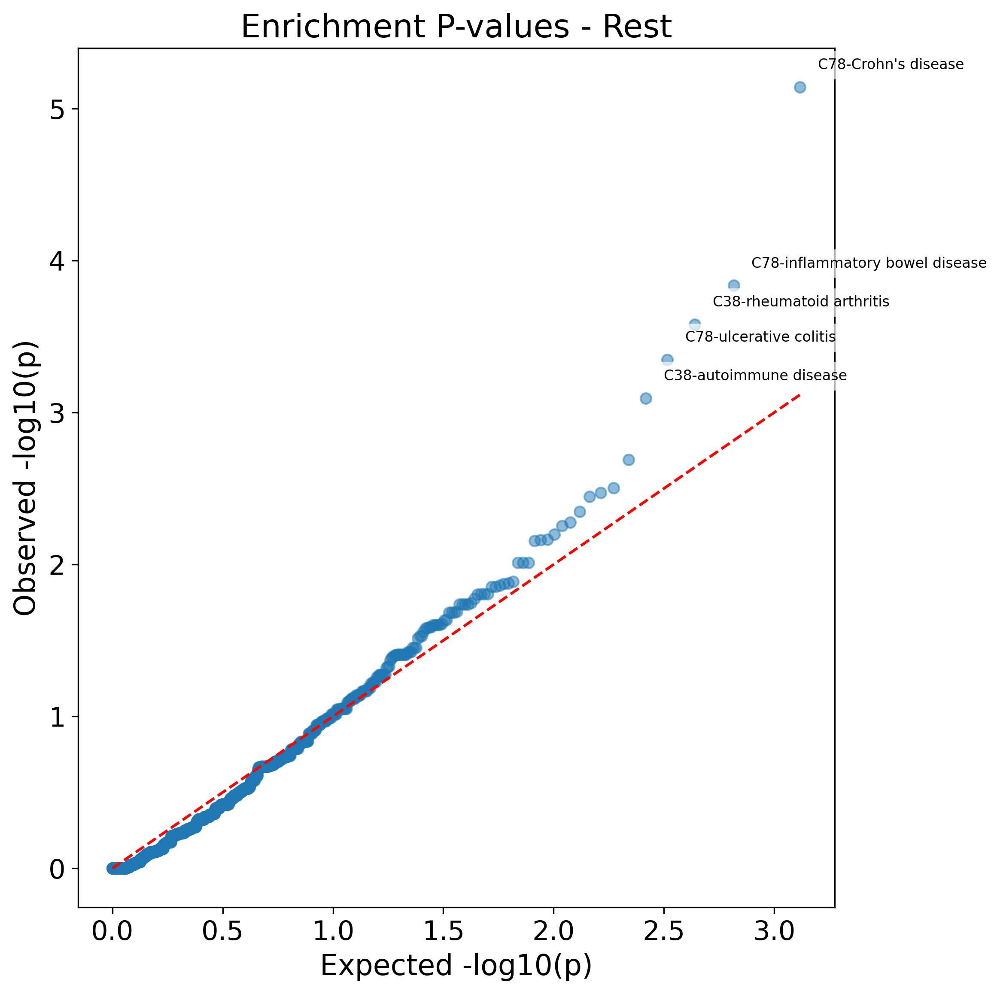

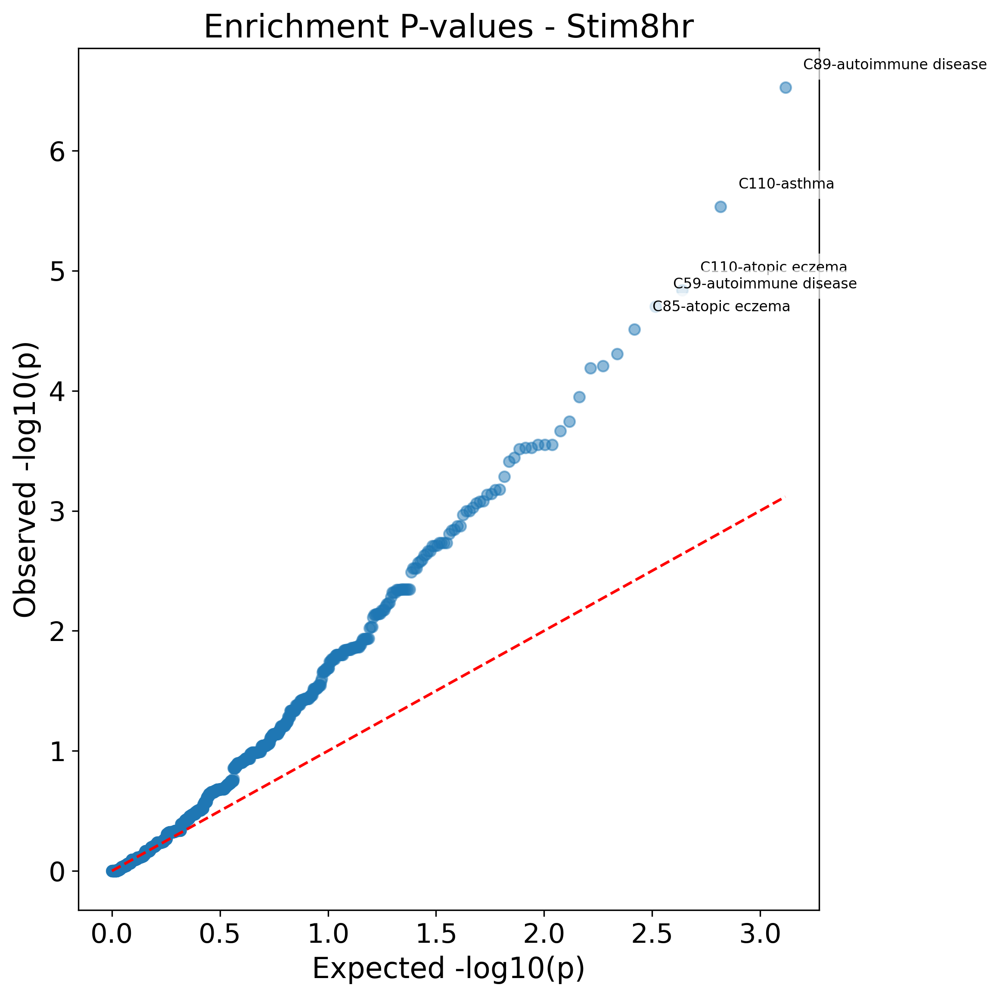

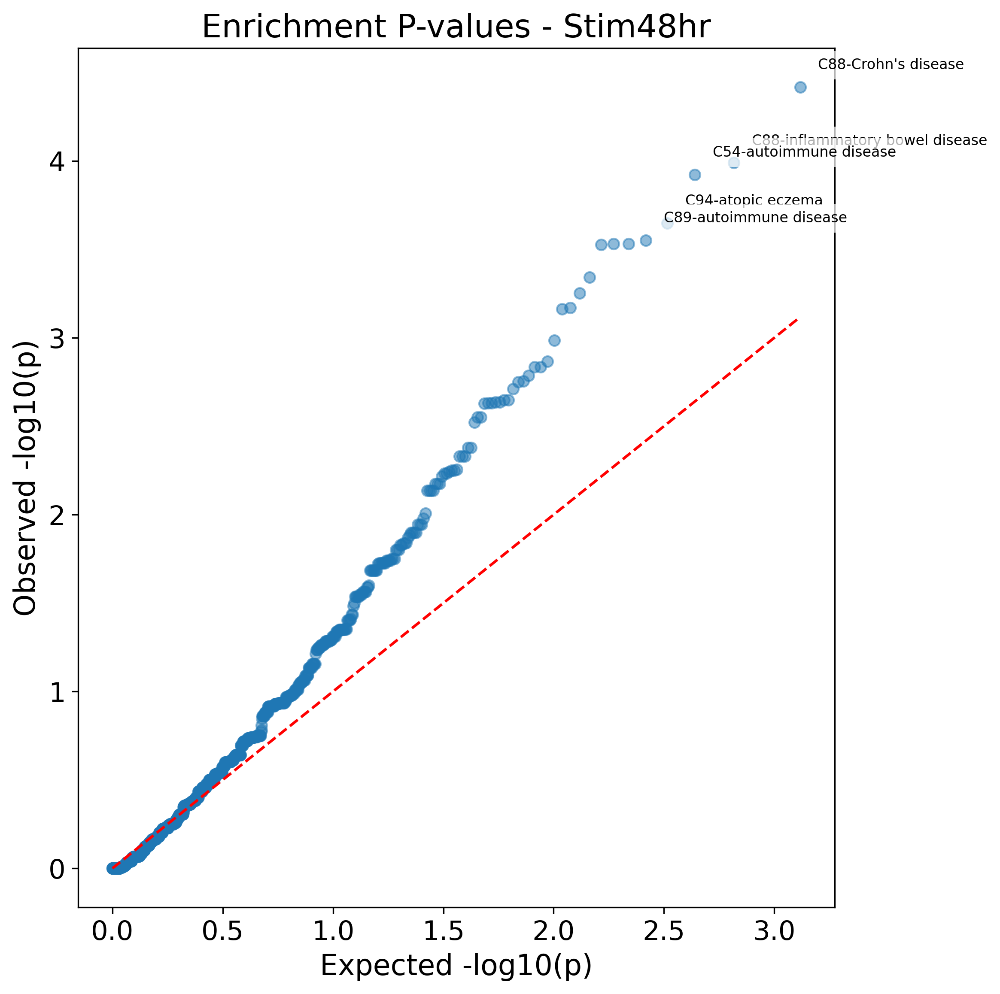

In [47]:
for c in ['Rest', 'Stim8hr', 'Stim48hr']:
    df = enrichment_results[enrichment_results.condition == c].copy()
    # Create QQ plot of p-values and annotate top cluster-disease pairs
    observed_p = -np.log10(sorted(df['p_value']))
    expected_p = -np.log10(np.linspace(0, 1, len(observed_p)+2)[1:-1])

    plt.figure(figsize=(8,8))
    plt.scatter(expected_p, observed_p, alpha=0.5)
    plt.plot([0, max(expected_p)], [0, max(expected_p)], 'r--')

    # Get top 5 most significant cluster-disease pairs
    top_pairs = df.nsmallest(5, 'p_value')
    for _, row in top_pairs.iterrows():
        x = -np.log10(row['p_value'])
        y = observed_p[np.abs(observed_p - x).argmin()]
        plt.annotate(f"C{row['cluster']}-{row['disease']}", 
                    xy=(expected_p[np.abs(observed_p - x).argmin()], y),
                    xytext=(10, 10), textcoords='offset points',
                    bbox=dict(facecolor='white', edgecolor='none', alpha=0.7),
                    fontsize=8)

    plt.xlabel('Expected -log10(p)')
    plt.ylabel('Observed -log10(p)') 
    plt.title(f'Enrichment P-values - {c}')
    plt.tight_layout()
    plt.show()

In [48]:
downstream_enrichment_df = enrichment_results.copy()

In [49]:
enrichment_df['gene_set'] = 'regulators'
downstream_enrichment_df['gene_set'] = 'downstream_' + downstream_enrichment_df['condition'].astype(str)

enrichment_df['cluster'] = enrichment_df.cluster.astype('str')
downstream_enrichment_df['cluster'] = downstream_enrichment_df.cluster.astype('str')

all_enrichment_df = pd.concat([enrichment_df, downstream_enrichment_df])
neg_ctrl_traits = ['chronic kidney disease', 'coronary artery disease', 'age-related macular degeneration']
all_enrichment_df['negative_control_disease'] = np.where(all_enrichment_df.disease.isin(neg_ctrl_traits), True, False)

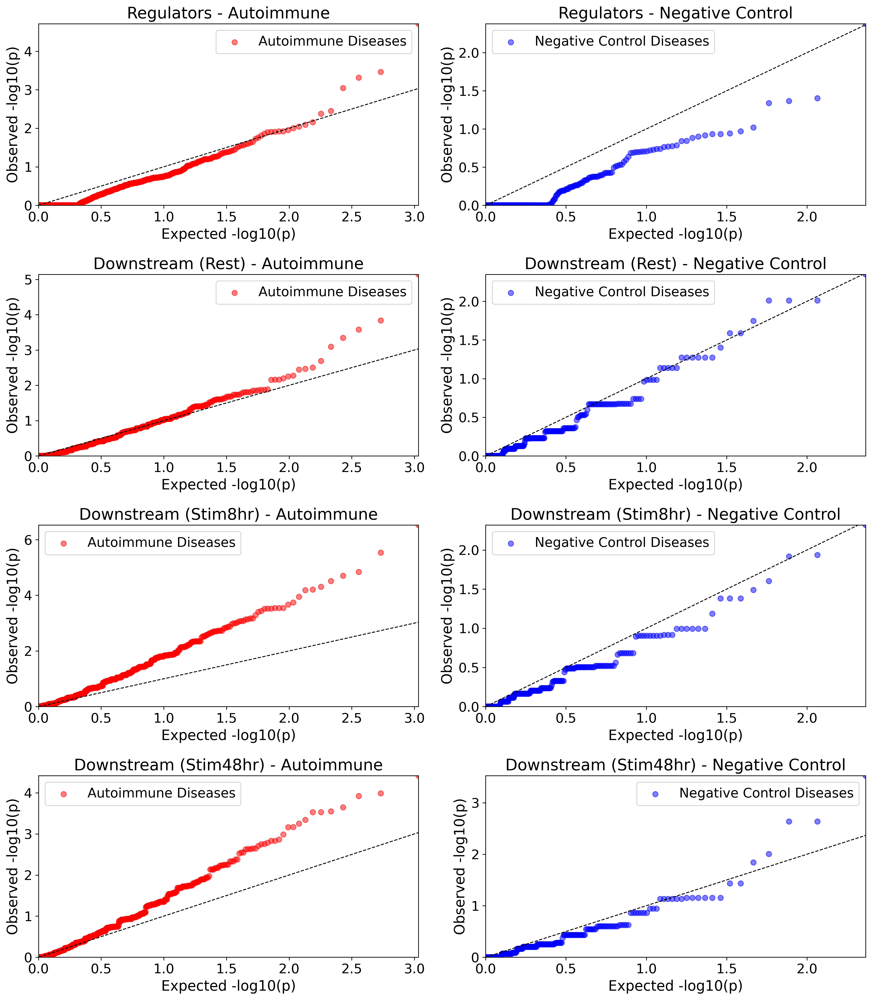

In [ ]:
# QQ plots for p-values for each downstream gene set separately (Rest, Stim8hr, Stim48hr), and for regulators

gene_sets_to_plot = [
    ("regulators", "Regulators"),
    ("downstream_Rest", "Downstream (Rest)"),
    ("downstream_Stim8hr", "Downstream (Stim8hr)"),
    ("downstream_Stim48hr", "Downstream (Stim48hr)"),
]

fig, axes = plt.subplots(
    len(gene_sets_to_plot), 2, figsize=(14, 4 * len(gene_sets_to_plot))
)

for idx, (gene_set, gene_set_label) in enumerate(gene_sets_to_plot):
    # First column: Autoimmune diseases
    ax1 = axes[idx, 0]
    autoimmune_mask = (
        (all_enrichment_df["gene_set"] == gene_set)
        & (~all_enrichment_df["negative_control_disease"])
    )
    autoimmune_p = all_enrichment_df[autoimmune_mask]["p_value"]
    autoimmune_p_sorted = -np.log10(np.sort(autoimmune_p))
    autoimmune_expected_p = -np.log10(
        np.linspace(0, 1, len(autoimmune_p_sorted) + 2)[1:-1]
    )
    max_x1 = autoimmune_expected_p.max() if len(autoimmune_expected_p) > 0 else 1
    max_y1 = autoimmune_p_sorted.max() if len(autoimmune_p_sorted) > 0 else 1
    ax1.scatter(
        autoimmune_expected_p, autoimmune_p_sorted, alpha=0.5, color="red", label="Autoimmune Diseases"
    )
    ax1.plot(
        [0, max_x1], [0, max_x1], "k--", lw=1
    )
    ax1.set_xlabel("Expected -log10(p)")
    ax1.set_ylabel("Observed -log10(p)")
    ax1.set_title(f"{gene_set_label} - Autoimmune")
    ax1.set_xlim(0, max_x1 if max_x1 > 1 else 1)
    ax1.set_ylim(0, max_y1 if max_y1 > 1 else 1)
    ax1.legend()

    # Second column: Negative Control diseases
    ax2 = axes[idx, 1]
    neg_ctrl_mask = (
        (all_enrichment_df["gene_set"] == gene_set)
        & (all_enrichment_df["negative_control_disease"])
    )
    neg_ctrl_p = all_enrichment_df[neg_ctrl_mask]["p_value"]
    neg_ctrl_p_sorted = -np.log10(np.sort(neg_ctrl_p))
    neg_ctrl_expected_p = -np.log10(
        np.linspace(0, 1, len(neg_ctrl_p_sorted) + 2)[1:-1]
    )
    max_x2 = neg_ctrl_expected_p.max() if len(neg_ctrl_expected_p) > 0 else 1
    max_y2 = neg_ctrl_p_sorted.max() if len(neg_ctrl_p_sorted) > 0 else 1
    ax2.scatter(
        neg_ctrl_expected_p, neg_ctrl_p_sorted, alpha=0.5, color="blue", label="Negative Control Diseases"
    )
    ax2.plot(
        [0, max_x2], [0, max_x2], "k--", lw=1
    )
    ax2.set_xlabel("Expected -log10(p)")
    ax2.set_ylabel("Observed -log10(p)")
    ax2.set_title(f"{gene_set_label} - Negative Control")
    ax2.set_xlim(0, max_x2 if max_x2 > 1 else 1)
    ax2.set_ylim(0, max_y2 if max_y2 > 1 else 1)
    ax2.legend()

plt.tight_layout()
plt.savefig("../results/GWAS_autoimmune_qqplots_each_downstream.pdf", bbox_inches="tight", dpi=300)
plt.savefig("../results/GWAS_autoimmune_qqplots_each_downstream.png", bbox_inches="tight", dpi=300)

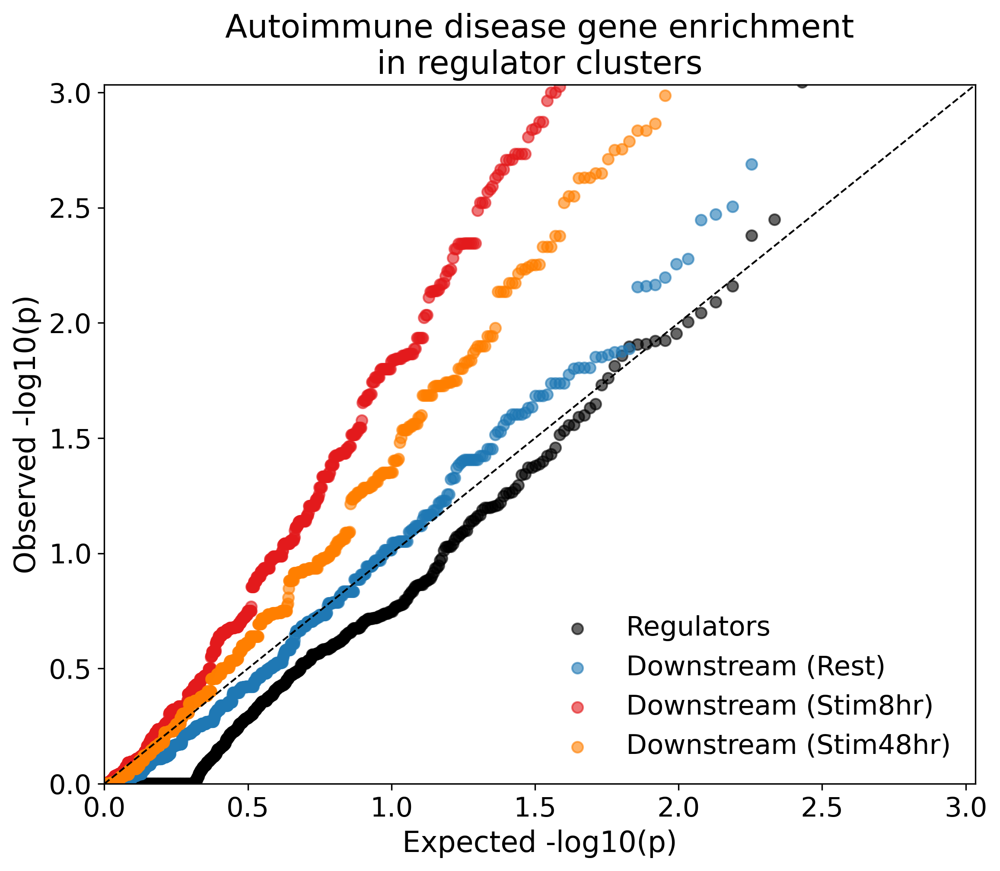

In [ ]:
# QQ plot for p-values for each gene set - autoimmune diseases only, shown all together on the same plot

gene_sets_to_plot = [
    ("regulators", "Regulators"),
    ("downstream_Rest", "Downstream (Rest)"),
    ("downstream_Stim8hr", "Downstream (Stim8hr)"),
    ("downstream_Stim48hr", "Downstream (Stim48hr)"),
]

plt.figure(figsize=(8, 7))
max_x, max_y = 0, 0

for gene_set, gene_set_label in gene_sets_to_plot:
    mask = (
        (all_enrichment_df["gene_set"] == gene_set)
        & (~all_enrichment_df["negative_control_disease"])
    )
    pvals = all_enrichment_df[mask]["p_value"]
    if len(pvals) == 0:
        continue
    observed = -np.log10(np.sort(pvals))
    expected = -np.log10(
        np.linspace(0, 1, len(observed) + 2)[1:-1]
    )
    # Determine color based on gene set
    if gene_set == "regulators":
        color = "black"
    else:
        # Assume downstream_* gene sets use culture_condition after "downstream_"
        culture = gene_set.replace("downstream_", "")
        color = palettes['culture_condition'][culture] if culture in palettes['culture_condition'] else "gray"
    plt.scatter(expected, observed, alpha=0.6, label=gene_set_label, color=color)
    max_x = max(max_x, expected.max())
    max_y = max(max_y, observed.max())
    
# Draw 1:1 line
plt.plot([0, max_x], [0, max_x], "k--", lw=1)

plt.xlabel("Expected -log10(p)")
plt.ylabel("Observed -log10(p)")
plt.title("Autoimmune disease gene enrichment\nin regulator clusters")
plt.legend(frameon=False)
plt.xlim(0, max_x)
plt.ylim(0, max_y * (max_x / max_y) if max_x > 0 and max_y > 0 else max_y)  # keep aspect ratio proportional to data range
plt.tight_layout()
plt.savefig("../results/GWAS_autoimmune_qqplots_main.pdf", bbox_inches="tight", dpi=300)
plt.savefig("../results/GWAS_autoimmune_qqplots_main.png", bbox_inches="tight", dpi=300)

In [52]:
all_enrichment_df['cluster'].nunique()

77

In [53]:
all_enrichment_df[(all_enrichment_df['p_adj_fdr'] < 0.1) & (~all_enrichment_df.negative_control_disease)]['cluster'].nunique()

33

In [54]:
all_enrichment_df[(all_enrichment_df['p_adj_fdr'] < 0.1) & (all_enrichment_df.negative_control_disease)] 

,odds_ratio,p_value,ci_low,ci_high,cluster_size,in_cluster_in_disease,in_cluster_not_disease,not_cluster_in_disease,not_cluster_not_disease,intersecting_genes,cluster,disease,p_adj_fdr,gene_set,condition,negative_control_disease
536,3.658074,0.004180,1.412011,8.447037,36,8.0,28.0,132.0,1692.0,"[OSR1, CCND2, CYP4V2, SFTPC, MSL2, SUPT4H1, HH...",105,coronary artery disease,0.071059,regulators,NaN,True
586,4.388633,0.004478,1.483990,10.770749,100,6.0,94.0,40.0,2753.0,"[SLC7A5, NIBAN1, RASGRP1, NHERF1, SETD7, VEGFA]",51,chronic kidney disease,0.076124,downstream_Rest,Rest,True
1946,3.492575,0.011548,1.200418,8.365614,100,6.0,94.0,57.0,3121.0,"[CELF1, DPP4, ASXL1, RASGRP1, PDE4D, CCND1]",59,chronic kidney disease,0.024540,downstream_Stim8hr,Stim8hr,True
2348,5.168671,0.004796,1.538177,13.778485,100,5.0,95.0,32.0,3146.0,"[CNN2, EIF4E3, FYB1, CMSS1, OAS1]",93,age-related macular degeneration,0.020385,downstream_Stim8hr,Stim8hr,True
2473,2.829759,0.041574,0.865960,7.223210,100,5.0,95.0,58.0,3120.0,"[PTPN22, MOB3A, LRIG1, NHERF1, ZEB2]",100,chronic kidney disease,0.058896,downstream_Stim8hr,Stim8hr,True
2609,3.454738,0.012096,1.187708,8.272066,101,6.0,95.0,57.0,3120.0,"[APOL1, CALCOCO2, PEAK1, PHTF2, APOL2, ZBTB7B]",111,chronic kidney disease,0.051410,downstream_Stim8hr,Stim8hr,True
2875,6.310938,0.002318,1.840645,17.373577,100,5.0,95.0,24.0,2882.0,"[KMT2E, NUDC, RASGRP1, FAM98B, GTF2A2]",27,age-related macular degeneration,0.019703,downstream_Stim48hr,Stim48hr,True
2926,7.986287,0.000298,2.598223,20.800200,100,6.0,94.0,23.0,2883.0,"[OAS3, NUDC, OAS1, CD55, IFNAR2, VEGFA]",31,age-related macular degeneration,0.005059,downstream_Stim48hr,Stim48hr,True
3198,6.310938,0.002318,1.840645,17.373577,100,5.0,95.0,24.0,2882.0,"[KMT2E, FYB1, NUDC, CD55, HSPH1]",51,age-related macular degeneration,0.039407,downstream_Stim48hr,Stim48hr,True
3255,3.643110,0.009846,1.245351,8.796922,100,6.0,94.0,50.0,2856.0,"[CALCOCO2, DPP4, CDC123, SOS2, PSD4, GAB2]",59,chronic kidney disease,0.083691,downstream_Stim48hr,Stim48hr,True


In [ ]:
## Save for supplementary table
col_order = ['cluster', 'disease',  'gene_set', 'odds_ratio', 'ci_low', 'ci_high', 'p_value', 'p_adj_fdr', 'cluster_size',
       'in_cluster_in_disease', 'in_cluster_not_disease',
       'not_cluster_in_disease', 'not_cluster_not_disease',
       'intersecting_genes', 'negative_control_disease'
       ]

all_enrichment_df[col_order].sort_values(['p_adj_fdr']).to_csv('../results/cluster_autoimmune_enrichment_results.csv', index=False)
all_enrichment_df[col_order].sort_values(['p_adj_fdr']).to_csv('../../../metadata/suppl_tables/cluster_autoimmune_enrichment_results.suppl_table.csv', index=False)

In [ ]:
all_enrichment_df = pd.read_csv('../../../metadata/suppl_tables/cluster_autoimmune_enrichment_results.suppl_table.csv')
n_signif = all_enrichment_df[(~all_enrichment_df['negative_control_disease']) & (all_enrichment_df.p_adj_fdr < 0.1)]['cluster'].nunique()
n_tested = all_enrichment_df['cluster'].nunique()

print(f"{n_signif}/{n_tested}")

33/77


In [57]:
enrichment_df[~enrichment_df['odds_ratio'].isna()].sort_values('p_adj_fdr')

,odds_ratio,p_value,ci_low,ci_high,cluster_size,in_cluster_in_disease,in_cluster_not_disease,not_cluster_in_disease,not_cluster_not_disease,intersecting_genes,cluster,disease,p_adj_fdr,gene_set
1088,58.173477,0.000019,8.162206,654.620158,6,4.0,2.0,61.0,1793.0,"[IRF4, BATF, STAT3, IPMK]",79,Crohn's disease,0.000329,regulators
1093,38.062949,0.000346,4.968082,291.736927,6,3.0,3.0,47.0,1807.0,"[IRF4, BATF, STAT3]",79,atopic eczema,0.002738,regulators
1098,24.005573,0.000483,3.407345,267.519245,6,4.0,2.0,142.0,1712.0,"[IRF4, BATF, STAT3, IPMK]",79,inflammatory bowel disease,0.002738,regulators
1100,26.898476,0.000903,3.536026,204.658011,6,3.0,3.0,66.0,1788.0,"[IRF4, STAT3, IPMK]",79,psoriasis,0.003836,regulators
1094,8.954787,0.012349,1.277477,99.372986,6,4.0,2.0,338.0,1516.0,"[IRF4, BATF, STAT3, IPMK]",79,autoimmune disease,0.034988,regulators
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
783,3.576726,0.262923,0.081853,25.234852,13,1.0,12.0,42.0,1805.0,[CBLB],100,Hashimoto's thyroiditis,1.000000,regulators
456,5.013209,0.211165,0.104731,45.649185,6,1.0,5.0,71.0,1783.0,[PHF12],6,systemic lupus erythematosus,1.000000,regulators
459,1.424047,0.329329,0.366849,3.984442,83,4.0,79.0,61.0,1716.0,"[RNASEH2C, GMEB2, DLD, IRF8]",96,Crohn's disease,1.000000,regulators
791,1.023968,0.639660,0.023785,7.015271,13,1.0,12.0,139.0,1708.0,[BPTF],100,coronary artery disease,1.000000,regulators


In [58]:
# Hide NAs for dotplots
enrichment_df = enrichment_df[~enrichment_df['odds_ratio'].isna()]
downstream_enrichment_df = downstream_enrichment_df[~downstream_enrichment_df['odds_ratio'].isna()]

## Dotplot visualization of enrichment results

In [59]:
# # Assign condition labels to each cluster
# def get_condition_label(row):
#     rest_frac = row['rest_fraction']
#     stim8hr_frac = row['stim8hr_fraction']
#     stim48hr_frac = row['stim48hr_fraction']
    
#     # Multi-condition: all three > 0.1
#     if rest_frac > 0.1 and stim8hr_frac > 0.1 and stim48hr_frac > 0.1:
#         return 'Multi-condition'
#     # Rest-specific
#     elif rest_frac > 0.7:
#         return 'Rest'
#     # Stim8hr-specific
#     elif stim8hr_frac > 0.7:
#         return 'Stim8hr'
#     # Stim48hr-specific
#     elif stim48hr_frac > 0.7:
#         return 'Stim48hr'
#     # Others - assign to dominant condition
#     else:
#         max_frac = max(rest_frac, stim8hr_frac, stim48hr_frac)
#         if max_frac == rest_frac:
#             return 'Rest'
#         elif max_frac == stim8hr_frac:
#             return 'Stim8hr'
#         else:
#             return 'Stim48hr'


In [60]:
# clustering_df['cluster'] = clustering_df['hdbscan'].astype(str).copy()
# clustering_df['culture_condition'] = clustering_df.index.str.split('_').str[1]

# # Get condition counts per cluster
# cluster2condition = clustering_df.groupby('cluster')['culture_condition'].value_counts().reset_index().pivot(index='cluster', columns='culture_condition', values='count')
# cluster2condition.sum(1)

# # Calculate total cells per cluster
# cluster2condition['total'] = cluster2condition.sum(1)

# # Calculate fractions
# cluster2condition['rest_fraction'] = cluster2condition['Rest'] / cluster2condition['total']
# cluster2condition['stim8hr_fraction'] = cluster2condition['Stim8hr'] / cluster2condition['total'] 
# cluster2condition['stim48hr_fraction'] = cluster2condition['Stim48hr'] / cluster2condition['total']

# # Display results
# cluster2condition = cluster2condition[['rest_fraction', 'stim8hr_fraction', 'stim48hr_fraction']].fillna(0)
# cluster2condition.head()

# cluster2condition['condition_label'] = cluster2condition.apply(get_condition_label, axis=1)

In [ ]:
cluster2condition = pd.read_csv('../results/nde75ntotal50_cluster_specificity.csv')
cluster2condition = cluster2condition.rename(columns={'hdbscan':'cluster', 'condition_specificity':'condition_label'})[['condition_label', 'cluster']]

In [62]:
cluster2condition.condition_label.unique()

array(['across_condition', 'Stim8hr', 'Stim8hr_Stim48hr', 'Rest',
       'Stim48hr', 'Rest_Stim8hr'], dtype=object)

In [77]:
def plot_dotplot_with_condition_heatmap(
    pl_enrichment_df, 
    condition_data, 
    disease_order=None, 
    cl_order=None,
    condition_palette=None, 
    clusters2highlight=None, 
    neg_ctrl_diseases=None, 
    plot_label = None,
    disease_label_fontsize = None,
    cmap = "Reds",
    figsize=(13, 4),
    legend_title='OpenTargets genetic association\nenrichment (-log10 FDR)',
    grey_condition=None,      
    show_xticks = False,
    grey_box_alpha=0.25,      
    plot_condition=True,      
    ax=None                   
):
    """
    Plots a dotplot (bubble plot) of enrichment by cluster, with an optional condition heatmap above, and optionally highlights provided clusters.
    - pl_enrichment_df: DataFrame with columns: cluster, disease, p_adj_fdr (and optionally more)
    - condition_data: DataFrame with 'cluster' and 'condition_label'
    - disease_order: explicit order for y-axis (list of diseases), optional
    - condition_palette: dict of label:color for top heatmap; optional (defaults to muted colors)
    - clusters2highlight: dict {cluster: color} to highlight specific clusters, optional
    - neg_ctrl_diseases: for separating negative controls, list of disease names, optional
    - figsize: plot size
    - legend_title: title for color/size bubble legend
    - grey_condition: condition_label or list of labels; columns with these condition labels will be shaded with a grey box (optional)
    - grey_box_alpha: transparency of grey box (default: 0.25)
    - plot_condition: if True (default), plot condition_labels as top panel; else,
      pass ax (the axis for dotplot) instead of using a 2-row layout.
    - ax: Matplotlib axis for main dotplot; required if plot_condition is False.
    """
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np

    if condition_palette is None:
        condition_palette = {
            'Rest': '#2077b4',
            'Stim8hr': '#ff7f0e',
            'Stim48hr': '#2ca02c',
            'Multi-condition': 'grey'
        }
    if clusters2highlight is None:
        clusters2highlight = dict()

    if disease_order is None:
        all_diseases = pl_enrichment_df['disease'].dropna().unique()
        if neg_ctrl_diseases is not None:
            disease_order = neg_ctrl_diseases + [d for d in all_diseases if d not in neg_ctrl_diseases]
        else:
            disease_order = list(all_diseases)
    if cl_order is None:
        cl_order = condition_data.sort_values('condition_label')['cluster'].astype(str).unique()

    pl_enrichment_df = pl_enrichment_df.copy()
    pl_enrichment_df['cluster'] = pl_enrichment_df['cluster'].astype(str)
    pl_enrichment_df['log10_p_adj_fdr'] = - np.log10(pl_enrichment_df['p_adj_fdr'].replace(0, np.nanmin(pl_enrichment_df['p_adj_fdr'].replace(0, np.nan))))
    pl_enrichment_df['signif'] = pl_enrichment_df['log10_p_adj_fdr'] >= 1
    pl_enrichment_df['disease'] = pd.Categorical(pl_enrichment_df['disease'], categories=disease_order, ordered=True)
    pl_enrichment_df = pl_enrichment_df.sort_values('disease')

    # --- Figure & Axis logic for optional condition panel ---
    if plot_condition:
        fig, (ax0, ax1) = plt.subplots(2, 1, figsize=figsize, 
                                       gridspec_kw={'height_ratios': [0.13, 0.87], 'hspace': 0.06},
                                       sharex=True)
        # Top panel: condition annotation
        plot_cond_idx = condition_data.set_index('cluster').loc[cl_order].index
        sns.scatterplot(
            x=plot_cond_idx,
            y=1, 
            hue=condition_data.set_index('cluster').loc[cl_order]['condition_label'],
            palette=condition_palette, 
            ax=ax0, 
            marker='s', 
            s=40, 
            legend=False
        )
        ax0.set_frame_on(False)
        ax0.grid(False)
        ax0.set_yticks([])
        ax0.set_ylabel('', fontsize=1)
        if show_xticks:
            ax0.set_xticks([])
        # Draw legend for condition labels (with one representative dot per label)
        handles = [
            plt.Line2D([0], [0], marker='s', color='w', markerfacecolor=color, markersize=10, label=lab)
            for lab, color in condition_palette.items()
            if lab in condition_data['condition_label'].unique()
        ]
        ax0.legend(handles=handles, bbox_to_anchor=(1.05, 0.5), loc='center left', frameon=False, fontsize=9, title='Condition', title_fontsize=10)
    else:
        if ax is None:
            raise ValueError("If plot_condition=False, must provide ax (main axis for dotplot).")
        ax1 = ax
        fig = ax1.figure
        ax0 = None

    # --- BEGIN grey box for columns from a specific condition (if requested) ---
    clusters_to_grey = []
    if grey_condition is not None:
        if isinstance(grey_condition, str):
            grey_condition = [grey_condition]
        clusters_to_grey = (
            condition_data.loc[
                (condition_data['condition_label'].isin(grey_condition)) &
                (condition_data['cluster'].isin(cl_order))
            ]['cluster'].astype(str).tolist()
        )
        for i, cl in enumerate(cl_order):
            if cl in clusters_to_grey:
                ax1.add_patch(
                    plt.Rectangle(
                        (i-0.5, -0.5),
                        1.0, 
                        len(disease_order),
                        facecolor='grey',
                        edgecolor=None,
                        linewidth=0,
                        alpha=grey_box_alpha,
                        zorder=0
                    )
                )
    # --- END grey box shading ---

    if clusters_to_grey:
        pl_enrichment_df_dot = pl_enrichment_df[~pl_enrichment_df['cluster'].isin(clusters_to_grey)]
    else:
        pl_enrichment_df_dot = pl_enrichment_df

    ax1.scatter(
        x=pl_enrichment_df_dot['cluster'],
        y=pl_enrichment_df_dot['disease'],
        s=pl_enrichment_df_dot['log10_p_adj_fdr']*20,
        c=pl_enrichment_df_dot['log10_p_adj_fdr'],
        linewidth=np.where(pl_enrichment_df_dot['signif'], 1, 0),
        edgecolor='black',
        cmap=cmap,
        vmin=0,
        vmax=3,
    )

    if neg_ctrl_diseases is not None and len(neg_ctrl_diseases) > 0:
        ax1.axhline(y=len(neg_ctrl_diseases)-0.5, color='black', linestyle=':', alpha=0.5)
    ax1.set_ylabel('Disease')
    if disease_label_fontsize is not None:
        for label in ax1.get_yticklabels():
            label.set_fontsize(disease_label_fontsize)
    ax1.set_xlabel('Regulator cluster')

    if plot_label is not None:
        ax1.text(len(cl_order) + 1, len(disease_order)/2, plot_label, 
            rotation=270, fontsize=16, fontweight='bold', va='center')

    if clusters2highlight:
        for cl, cl_color in clusters2highlight.items():
            if cl not in clusters_to_grey:
                try:
                    ix = [i for i, c in enumerate(cl_order) if c == cl][0]
                except ValueError:
                    continue
                ax1.add_patch(
                    plt.Rectangle(
                        (ix-0.8, -0.5),
                        1.5, 
                        len(disease_order),
                        fill=False, 
                        edgecolor=cl_color, 
                        linewidth=2, 
                        alpha=0.5
                    )
                )
            else:
                continue
    # Set x limits for both panels if condition plot is on; otherwise, only ax1
    if plot_condition:
        plt.setp(ax0, xlim=(-1, len(cl_order)))
        plt.setp(ax1, xlim=(-1, len(cl_order)))
    else:
        ax1.set_xlim(-1, len(cl_order))

    ymargin = 0.1
    ax1.set_ylim(-0.5 + ymargin, len(disease_order) - 0.5 - ymargin)

    ax1.set_ylabel('Disease')
    ax1.set_xlabel('Regulator cluster')
    if not show_xticks:
        ax1.set_xticks([])
    else:
        ax1.set_xticks(np.arange(len(cl_order)))
        ax1.set_xticklabels(cl_order, rotation=90, fontsize=12)
    ax1.set_yticks(np.arange(len(disease_order)))
    ax1.set_yticklabels(disease_order, rotation=0)

    scatter_sizes = [1, 2, 3]
    if isinstance(cmap, str):
        import matplotlib.pyplot as plt
        this_cmap = plt.get_cmap(cmap)
        scatter_colors = [this_cmap(0.3), this_cmap(0.6), this_cmap(0.9)]
    else:
        scatter_colors = [cmap(0.3), cmap(0.6), cmap(0.9)]
    legend_elements = [
        plt.scatter([], [], s=size*20, c=[color], label=f"{size}", edgecolors='black', linewidth=1)
        for size, color in zip(scatter_sizes, scatter_colors)
    ]
    fig.legend(
        handles=legend_elements,
        title=legend_title,
        loc='upper center',
        bbox_to_anchor=(0.5, 1.08),
        scatterpoints=1,
        frameon=False,
        ncols=3
    )
    plt.tight_layout()
    # Return fig and axes in tuple: (ax0, ax1) if plot_condition, else (None, ax1)
    return fig, (ax0, ax1) if plot_condition else (fig, (None, ax1))

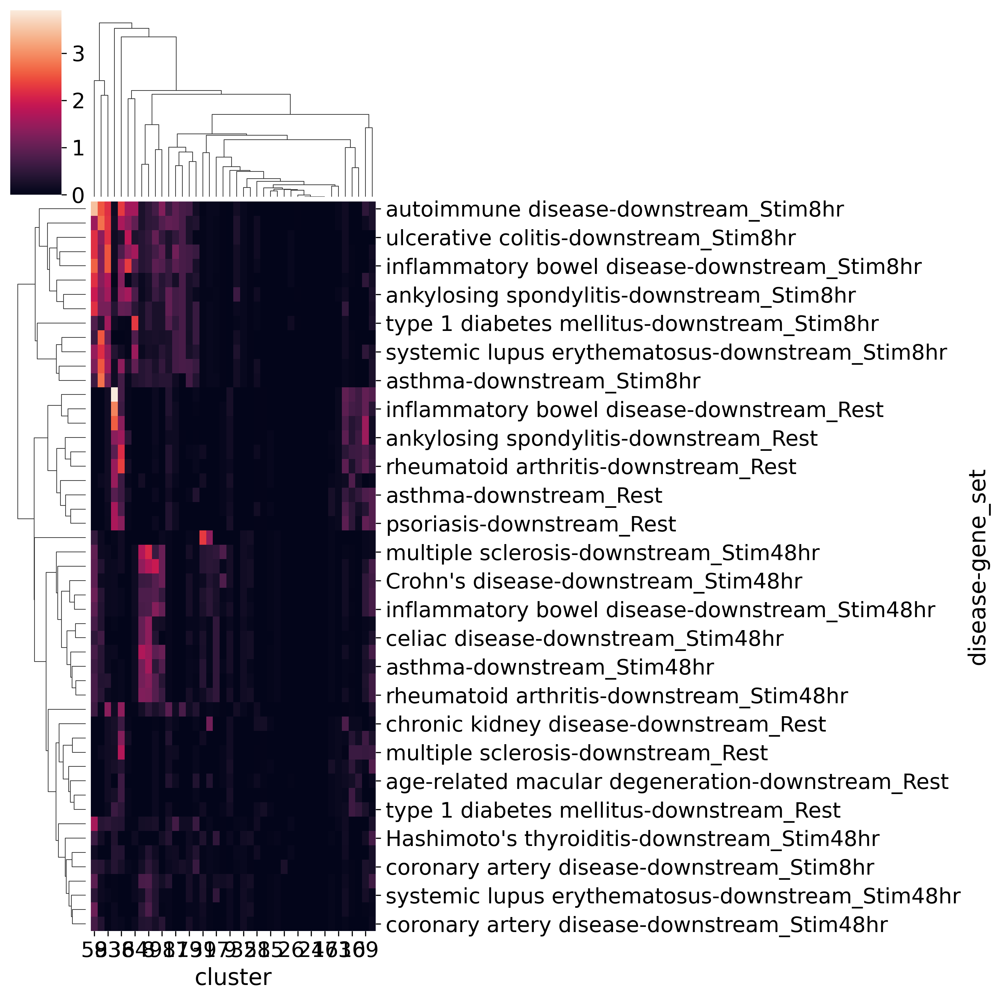

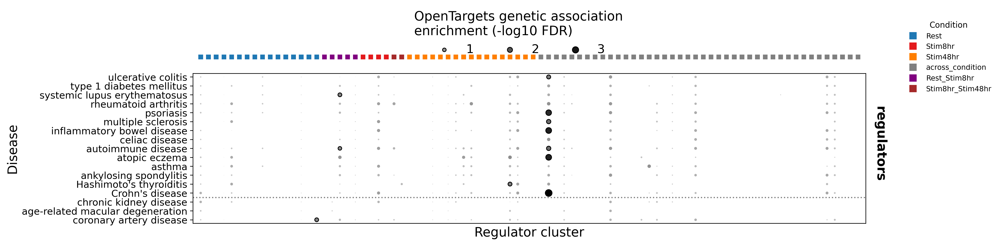

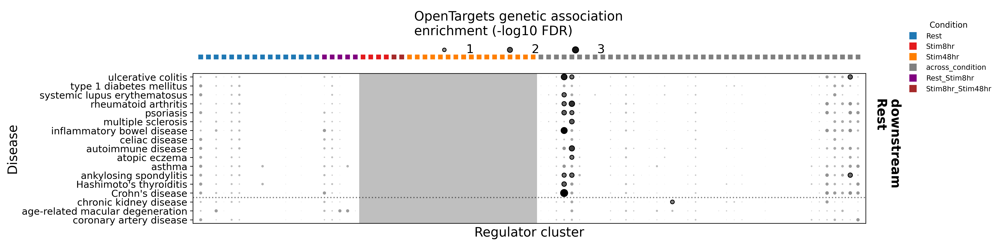

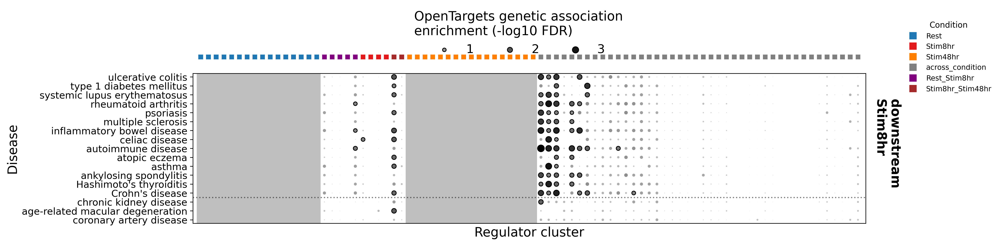

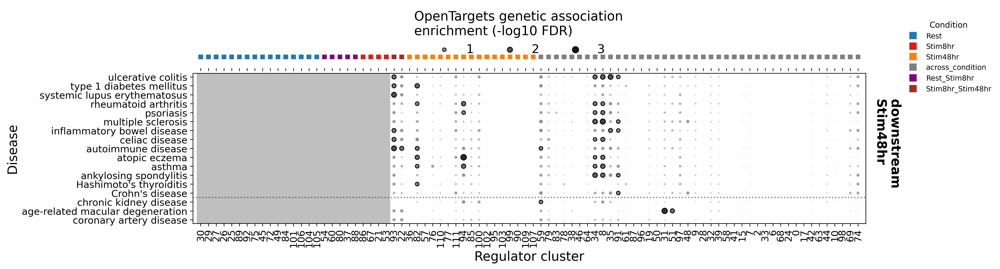

In [ ]:
# Define condition class colors
cond_class_order = ['Rest','Rest_Stim8hr', 'Stim8hr', 'Stim8hr_Stim48hr', 
       'Stim48hr', 'across_condition']

condition_colors = palettes['culture_condition'].copy()
condition_colors['across_condition'] = 'grey'
condition_colors['Rest_Stim8hr'] = 'purple'
condition_colors['Stim8hr_Stim48hr'] = 'brown'

# Create disease order with negative controls at bottom
neg_ctrl_diseases = ['coronary artery disease', 'age-related macular degeneration', 'chronic kidney disease']
all_diseases = enrichment_df['disease'].unique()
disease_order =  neg_ctrl_diseases + [d for d in all_diseases if d not in neg_ctrl_diseases] 

condition_data = cluster2condition.copy()
condition_data['cluster'] = condition_data['cluster'].astype(str)
condition_data['condition_label'] = pd.Categorical(condition_data['condition_label'], categories=cond_class_order)
# Sort clusters by condition_label first (Rest, Rest_Stim8hr, ...), but reorder across_condition clusters by clustermap_col_labels
cl_order = condition_data.sort_values('condition_label')['cluster'].unique()

# Compute optimal across_condition order from downstream enrichment
order_multi_df = downstream_enrichment_df.copy()
across_clusters = condition_data[condition_data.condition_label == 'across_condition']['cluster'].tolist()
order_multi_df = order_multi_df[order_multi_df['cluster'].isin(across_clusters)]
order_multi_df = order_multi_df.pivot(
    columns=['cluster'],
    index=['disease', 'gene_set'],
    values='p_adj_fdr'
).fillna(1)
order_multi_df = -np.log10(order_multi_df)
g = sns.clustermap(order_multi_df, row_cluster=True)
order_multi_col_inds = g.dendrogram_col.reordered_ind
clustermap_col_labels = [str(order_multi_df.columns[i]) for i in order_multi_col_inds]
other_clusters = [str(cl) for cl in cl_order if cl not in across_clusters]
cl_order = other_clusters + clustermap_col_labels


all_dfs = {
    'regulators':enrichment_df,
    'downstream_Rest':downstream_enrichment_df[downstream_enrichment_df['gene_set'] == 'downstream_Rest'],
    'downstream_Stim8hr':downstream_enrichment_df[downstream_enrichment_df['gene_set'] == 'downstream_Stim8hr'],
    'downstream_Stim48hr':downstream_enrichment_df[downstream_enrichment_df['gene_set'] == 'downstream_Stim48hr'],
}

for label,df in all_dfs.items():
    pl_enrichment_df = df.copy()
    pl_enrichment_df['cluster'] = pl_enrichment_df.cluster.astype('str')
    pl_enrichment_df = pd.merge(pl_enrichment_df, condition_data, how='left')
    pl_enrichment_df['cluster'] = pd.Categorical(pl_enrichment_df['cluster'], categories=cl_order)
    
    if label == 'regulators':
        grey_conditions = None
        figsize = (15,4)
        show_xticks=False
        # cmap = 'Greys'
    if label == 'downstream_Rest':
        grey_conditions = ['Stim8hr', 'Stim8hr_Stim48hr','Stim48hr']
        figsize = (15,4)
        show_xticks=False
        # cmap = condition_colormaps['Rest']
    if label == 'downstream_Stim8hr':
        grey_conditions = ['Rest', 'Stim48hr']
        figsize = (15,4)
        show_xticks=False
        # cmap = condition_colormaps['Stim8hr']
    if label == 'downstream_Stim48hr':
        grey_conditions = ['Rest', 'Rest_Stim8hr','Stim8hr']
        figsize = (15,4)
        show_xticks=True
        # cmap = condition_colormaps['Stim48hr']
    
    cmap = mcolors.LinearSegmentedColormap.from_list('regulators', ['lightgray', 'black'])

    pl_label = label.replace("_", '\n')
    fig, axes = plot_dotplot_with_condition_heatmap(
        pl_enrichment_df,
        condition_data,
        disease_order=disease_order,
        cl_order = cl_order,
        condition_palette=condition_colors,
        plot_label=pl_label,
        cmap=cmap,
        disease_label_fontsize=12,
        clusters2highlight=None,
        neg_ctrl_diseases=neg_ctrl_diseases,
        grey_condition = grey_conditions, grey_box_alpha=0.5,
        figsize=figsize, show_xticks=show_xticks
    )
    fig.tight_layout()
    fig.savefig(f'../results/GWAS_autoimmune_dotplot_figure.{label}.pdf', bbox_inches='tight', dpi=600)
    fig.savefig(f'../results/GWAS_autoimmune_dotplot_figure.{label}.png', bbox_inches='tight', dpi=600)

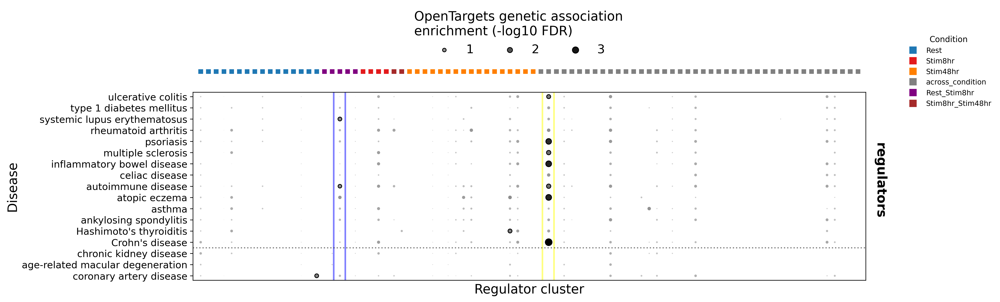

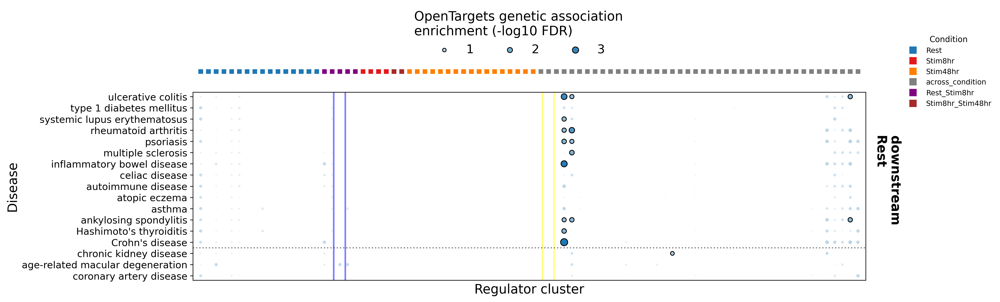

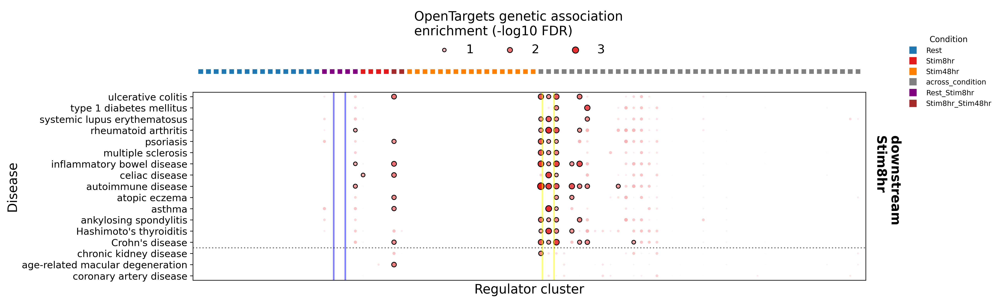

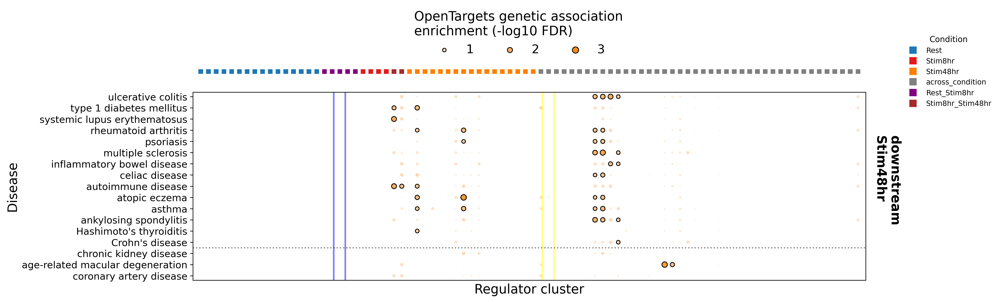

In [ ]:
all_dfs = {
    'regulators':enrichment_df,
    'downstream_Rest':downstream_enrichment_df[downstream_enrichment_df['gene_set'] == 'downstream_Rest'],
    'downstream_Stim8hr':downstream_enrichment_df[downstream_enrichment_df['gene_set'] == 'downstream_Stim8hr'],
    'downstream_Stim48hr':downstream_enrichment_df[downstream_enrichment_df['gene_set'] == 'downstream_Stim48hr'],
}

downstream_enrichment_df['cluster'] = downstream_enrichment_df.cluster.astype('str')
downstream_enrichment_df = pd.merge(downstream_enrichment_df, condition_data, how='left')
downstream_enrichment_df['cluster'] = pd.Categorical(downstream_enrichment_df['cluster'], categories=cl_order)

pairings = {
    'Rest':['Rest', 'Rest_Stim8hr', 'across_condition'],
    'Stim8hr':['Rest_Stim8hr', 'Stim8hr', 'Stim8hr_Stim48hr', 'across_condition'],
    'Stim48hr':['Stim48hr', 'Stim8hr_Stim48hr', 'across_condition'] 
    }

downstream_enrichment_keep_df = pd.DataFrame()
for k,classes in pairings.items():
    k_df = downstream_enrichment_df[(downstream_enrichment_df['gene_set'] == f'downstream_{k}') & (downstream_enrichment_df['condition_label'].isin(classes))]
    downstream_enrichment_keep_df = pd.concat([downstream_enrichment_keep_df, k_df])

downstream_enrichment_keep_df = downstream_enrichment_keep_df.loc[
    downstream_enrichment_keep_df.groupby(['cluster', 'disease'], observed=True)['p_adj_fdr'].idxmin()
]


all_dfs = {
    'regulators':enrichment_df,
    'downstream_Rest':downstream_enrichment_keep_df[downstream_enrichment_keep_df['gene_set'] == 'downstream_Rest'],
    'downstream_Stim8hr':downstream_enrichment_keep_df[downstream_enrichment_keep_df['gene_set'] == 'downstream_Stim8hr'],
    'downstream_Stim48hr':downstream_enrichment_keep_df[downstream_enrichment_keep_df['gene_set'] == 'downstream_Stim48hr'],
}


for label,df in all_dfs.items():
    pl_enrichment_df = df.copy()
    pl_enrichment_df['cluster'] = pl_enrichment_df.cluster.astype('str')
    pl_enrichment_df = pd.merge(pl_enrichment_df, condition_data, how='left')
    pl_enrichment_df['cluster'] = pd.Categorical(pl_enrichment_df['cluster'], categories=cl_order)
    
    figsize = (15,5)
    if label == 'regulators':
        grey_conditions = None
        cmap = mcolors.LinearSegmentedColormap.from_list('regulators', ['lightgray', 'black'])
    if label == 'downstream_Rest':
        cmap = condition_colormaps['Rest']
        c = condition_colors['Rest']
        plot_conditions = False
    if label == 'downstream_Stim8hr':
        cmap = condition_colormaps['Stim8hr']
        c = condition_colors['Stim8hr']
        plot_conditions = False
    if label == 'downstream_Stim48hr':
        cmap = condition_colormaps['Stim48hr']
        c = condition_colors['Stim48hr']
        plot_conditions = False

    pl_label = label.replace("_", '\n')
    fig, axes = plot_dotplot_with_condition_heatmap(
        pl_enrichment_df,
        condition_data,
        disease_order=disease_order,
        cl_order = cl_order,
        condition_palette=condition_colors,
        plot_label=pl_label,
        cmap=cmap,
        disease_label_fontsize=12,
        clusters2highlight={'80':'blue', '79':'yellow'},
        neg_ctrl_diseases=neg_ctrl_diseases,
        # plot_condition=plot_conditions, ax=ax,
        figsize=figsize
    )

    fig.savefig(f'../results/GWAS_autoimmune_dotplot_figure.{label}_color.pdf', bbox_inches='tight', dpi=600)

In [79]:
### Combined Heatmap: Regulators and Downstream Gene Enrichment (Split by Downstream Gene Set Categories)

# Prepare heatmap data for upstream genes (regulators)
heatmap_data = enrichment_df.pivot_table(
    index='cluster', 
    columns='disease', 
    values='odds_ratio', 
    fill_value=1.0
)
sig_fdr = enrichment_df.pivot_table(
    index='cluster', 
    columns='disease', 
    values='p_adj_fdr', 
    fill_value=1.0
) < 0.1
sig_nominal = enrichment_df.pivot_table(
    index='cluster', 
    columns='disease', 
    values='p_value', 
    fill_value=1.0
) < 0.05

# Prepare sets for each downstream gene set category
downstream_gene_set_categories = ['downstream_Rest', 'downstream_Stim8hr', 'downstream_Stim48hr']

# Dictionaries to store results per category
heatmap_data_downstream_all = {}
sig_fdr_downstream_all = {}
sig_nominal_downstream_all = {}

for category in downstream_gene_set_categories:
    # Subset dataframe for category
    df_cat = downstream_enrichment_df.loc[
        downstream_enrichment_df['gene_set'] == category
    ]
    # Build odds ratio heatmap
    heatmap = df_cat.pivot_table(
        index='cluster',
        columns='disease',
        values='odds_ratio',
        fill_value=1.0
    )
    # Significance
    sig_fdr_cat = df_cat.pivot_table(
        index='cluster',
        columns='disease',
        values='p_adj_fdr',
        fill_value=1.0
    ) < 0.1
    sig_nominal_cat = df_cat.pivot_table(
        index='cluster',
        columns='disease',
        values='p_value',
        fill_value=1.0
    ) < 0.05

    heatmap_data_downstream_all[category] = heatmap
    sig_fdr_downstream_all[category] = sig_fdr_cat
    sig_nominal_downstream_all[category] = sig_nominal_cat

# Get combined union of clusters and diseases across all gene sets
all_clusters = set(heatmap_data.index)
all_diseases = set(heatmap_data.columns)
for cat in downstream_gene_set_categories:
    all_clusters |= set(heatmap_data_downstream_all[cat].index)
    all_diseases |= set(heatmap_data_downstream_all[cat].columns)
all_clusters = sorted(all_clusters)
all_diseases = sorted(all_diseases)

# Reindex to align all tables
heatmap_perturbed = heatmap_data.reindex(index=all_clusters, columns=all_diseases, fill_value=1.0)
sig_fdr_perturbed_aligned = sig_fdr.reindex(index=all_clusters, columns=all_diseases, fill_value=False)
sig_nominal_perturbed_aligned = sig_nominal.reindex(index=all_clusters, columns=all_diseases, fill_value=False)

heatmap_downstream_aligned_all = {}
sig_fdr_downstream_aligned_all = {}
sig_nominal_downstream_aligned_all = {}
for cat in downstream_gene_set_categories:
    heatmap_downstream_aligned_all[cat] = heatmap_data_downstream_all[cat].reindex(
        index=all_clusters, columns=all_diseases, fill_value=1.0)
    sig_fdr_downstream_aligned_all[cat] = sig_fdr_downstream_all[cat].reindex(
        index=all_clusters, columns=all_diseases, fill_value=False)
    sig_nominal_downstream_aligned_all[cat] = sig_nominal_downstream_all[cat].reindex(
        index=all_clusters, columns=all_diseases, fill_value=False)

# Decide which clusters to keep: Keep clusters with at least one nominally significant result
has_sig_result = sig_nominal_perturbed_aligned.any(axis=1)
for cat in downstream_gene_set_categories:
    has_sig_result = has_sig_result | sig_nominal_downstream_aligned_all[cat].any(axis=1)
clusters_to_keep = has_sig_result[has_sig_result].index

# Filter all data to keep only significant clusters (regulators and all downstream categories)
heatmap_perturbed = heatmap_perturbed.loc[clusters_to_keep]
sig_fdr_perturbed_aligned = sig_fdr_perturbed_aligned.loc[clusters_to_keep]
sig_nominal_perturbed_aligned = sig_nominal_perturbed_aligned.loc[clusters_to_keep]

for cat in downstream_gene_set_categories:
    heatmap_downstream_aligned_all[cat] = heatmap_downstream_aligned_all[cat].loc[clusters_to_keep]
    sig_fdr_downstream_aligned_all[cat] = sig_fdr_downstream_aligned_all[cat].loc[clusters_to_keep]
    sig_nominal_downstream_aligned_all[cat] = sig_nominal_downstream_aligned_all[cat].loc[clusters_to_keep]

# - heatmap_perturbed (regulator clusters x diseases)
# - heatmap_downstream_aligned_all[category] for each downstream gene set category (same shape/order)


# # Convert to log scale
# log_odds_perturbed = np.log2(heatmap_perturbed.clip(lower=0.1)).replace([np.inf, -np.inf], 0)
# log_odds_downstream_aligned = np.log2(heatmap_downstream_aligned.clip(lower=0.1)).replace([np.inf, -np.inf], 0)

# # Cluster rows based on combined data from both panels
# combined_for_clustering = pd.concat([log_odds_perturbed, log_odds_downstream_aligned], axis=1)
# row_linkage_combined = hierarchy.linkage(combined_for_clustering, method='average')
# row_dendrogram_combined = hierarchy.dendrogram(row_linkage_combined, no_plot=True)
# row_order_combined = row_dendrogram_combined['leaves']

# # Cluster columns separately for each panel
# col_linkage_perturbed = hierarchy.linkage(log_odds_perturbed.T, method='average')
# col_dendrogram_perturbed = hierarchy.dendrogram(col_linkage_perturbed, no_plot=True)
# col_order_perturbed = col_dendrogram_perturbed['leaves']

# col_linkage_downstream = hierarchy.linkage(log_odds_downstream_aligned.T, method='average')
# col_dendrogram_downstream = hierarchy.dendrogram(col_linkage_downstream, no_plot=True)
# col_order_downstream = col_dendrogram_downstream['leaves']

# # Reorder all matrices
# log_odds_perturbed = log_odds_perturbed.iloc[row_order_combined].iloc[:, col_order_perturbed]
# log_odds_downstream_aligned = log_odds_downstream_aligned.iloc[row_order_combined].iloc[:, col_order_downstream]

# # Create row labels with cluster ID
# row_labels_combined = [f"Cluster {cluster_id}" for cluster_id in log_odds_perturbed.index]

# # Reorder significance matrices
# sig_fdr_perturbed_aligned = sig_fdr_perturbed_aligned.iloc[row_order_combined].iloc[:, col_order_perturbed]
# sig_nominal_perturbed_aligned = sig_nominal_perturbed_aligned.iloc[row_order_combined].iloc[:, col_order_perturbed]
# sig_fdr_downstream_aligned = sig_fdr_downstream_aligned.iloc[row_order_combined].iloc[:, col_order_downstream]
# sig_nominal_downstream_aligned = sig_nominal_downstream_aligned.iloc[row_order_combined].iloc[:, col_order_downstream]

# # Align cluster2condition with the same row ordering
# cluster2condition_aligned = cluster2condition.reindex(log_odds_perturbed.index)

In [ ]:
# # Create figure with three subplots side by side
# fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(14, max(5, len(row_labels_combined) * 0.23)), 
#                                      gridspec_kw={'width_ratios': [0.5, 1, 1], 'wspace': 0.05})

# # Left panel: Condition distribution
# sns.heatmap(cluster2condition_aligned,
#             cmap='Reds',
#             cbar=False,
#             xticklabels=True,
#             yticklabels=row_labels_combined,
#             ax=ax1)

# ax1.set_title('Condition Distribution', fontsize=12, fontweight='bold')
# ax1.set_xlabel('Condition', fontsize=10)
# ax1.set_ylabel('Regulator cluster', fontsize=10)
# ax1.tick_params(axis='x', rotation=90, labelsize=9)
# ax1.tick_params(axis='y', labelsize=8)

# # Middle panel: Perturbed genes (regulators)
# sns.heatmap(log_odds_perturbed,
#             cmap='RdYlBu_r',
#             center=0,
#             annot=False, 
#             cbar=False,
#             xticklabels=True,
#             yticklabels=False,
#             ax=ax2,
#             vmin=-6, vmax=6)

# # Add significance indicators for perturbed
# for i in range(len(log_odds_perturbed.index)):
#     for j in range(len(log_odds_perturbed.columns)):
#         if sig_fdr_perturbed_aligned.iloc[i,j]:
#             ax2.text(j+0.5, i+0.5, '★', ha='center', va='center', 
#                     color='black', fontsize=10, fontweight='bold')
#         elif sig_nominal_perturbed_aligned.iloc[i,j]:
#             ax2.text(j+0.5, i+0.5, '•', ha='center', va='center', 
#                     color='black', fontsize=12, fontweight='bold')

# ax2.set_title('Regulators', fontsize=12, fontweight='bold')
# ax2.set_xlabel('Disease', fontsize=10)
# ax2.set_ylabel('', fontsize=10)
# ax2.tick_params(axis='x', rotation=90, labelsize=9)

# # Right panel: Downstream genes
# sns.heatmap(log_odds_downstream_aligned,
#             cmap='RdYlBu_r',
#             center=0,
#             annot=False, 
#             cbar_kws={'label': 'Log2(Odds Ratio)'},
#             xticklabels=True,
#             yticklabels=False,
#             ax=ax3,
#             vmin=-2, vmax=2)

# # Add significance indicators for downstream
# for i in range(len(log_odds_downstream_aligned.index)):
#     for j in range(len(log_odds_downstream_aligned.columns)):
#         if sig_fdr_downstream_aligned.iloc[i,j]:
#             ax3.text(j+0.5, i+0.5, '★', ha='center', va='center', 
#                     color='black', fontsize=10, fontweight='bold')
#         elif sig_nominal_downstream_aligned.iloc[i,j]:
#             ax3.text(j+0.5, i+0.5, '•', ha='center', va='center', 
#                     color='black', fontsize=12, fontweight='bold')

# ax3.set_title('Downstream Genes', fontsize=12, fontweight='bold')
# ax3.set_xlabel('Disease', fontsize=10)
# ax3.set_ylabel('', fontsize=10)
# ax3.tick_params(axis='x', rotation=90, labelsize=9)

# # Overall title
# fig.suptitle('GWAS Autoimmune Gene Enrichment: Regulators vs Downstream\n★ = FDR < 0.1, • = p < 0.05', 
#              fontsize=14, fontweight='bold', y=0.998)

# fig.tight_layout()
# plt.savefig("../results/combined_perturbed_downstream_GWAS_enrichment.pdf", bbox_inches='tight')
# plt.savefig("../results/combined_perturbed_downstream_GWAS_enrichment.png", bbox_inches='tight', dpi=300)
# plt.show()

In [102]:
neg_ctrl_traits = ['chronic kidney disease', 'coronary artery disease', 'age-related macular degeneration']
enrichment_df = enrichment_df[~enrichment_df['disease'].isin(neg_ctrl_traits)].copy()
downstream_enrichment_df = downstream_enrichment_df[~downstream_enrichment_df['disease'].isin(neg_ctrl_traits)].copy()


In [103]:
enrichment_df[enrichment_df['p_adj_fdr'] < 0.1]['cluster'].value_counts()

cluster
79    8
25    5
44    5
80    3
94    3
38    2
93    2
99    1
19    1
22    1
85    1
Name: count, dtype: int64

In [106]:
enrichment_df[enrichment_df['p_adj_fdr'] < 0.1]['cluster'].value_counts()

cluster
79    8
25    5
44    5
80    3
94    3
38    2
93    2
99    1
19    1
22    1
85    1
Name: count, dtype: int64

In [107]:
downstream_enrichment_df[downstream_enrichment_df['p_adj_fdr'] < 0.1]['cluster'].value_counts()

cluster
79    12
82    10
46     7
93     6
38     4
61     4
94     4
59     1
86     1
88     1
Name: count, dtype: int64

## Follow-up on specific clusters

In [312]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch, Circle
import numpy as np


def plot_gene_perturbation(
    perturbed_genes,
    positive_genes=None,
    negative_genes=None,
    highlight_genes=None,
    context_label="Context",
    context_color="#d9534f",
    positive_label="Positively affected",
    negative_label="Negatively affected",
    figsize=(12, 6),
    save_path=None
):
    """
    Create a visualization of gene perturbation effects.
    
    Parameters:
    -----------
    perturbed_genes : list
        List of perturbed/upstream genes
    positive_genes : list, optional
        List of positively affected downstream genes
    negative_genes : list, optional
        List of negatively affected downstream genes
    highlight_genes : list, optional
        List of perturbed genes to highlight (will be shown in bold/red)
    context_label : str
        Label for the context annotation
    context_color : str
        Color for the context circle/border (hex or named color)
    positive_label : str
        Label for the positive effects box
    negative_label : str
        Label for the negative effects box
    figsize : tuple
        Figure size (width, height)
    save_path : str, optional
        If provided, save the figure to this path
    
    Returns:
    --------
    fig, ax : matplotlib figure and axis objects
    """
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Box parameters
    box_width = 1.8
    line_height = 0.35  # Height per gene line
    
    # Calculate box heights based on number of genes
    perturbed_box_height = max(0.8, len(perturbed_genes) * line_height + 0.5)
    
    # Calculate downstream box heights
    has_positive = positive_genes and len(positive_genes) > 0
    has_negative = negative_genes and len(negative_genes) > 0
    
    if has_positive:
        positive_box_height = max(0.8, len(positive_genes) * line_height + 0.5)
    if has_negative:
        negative_box_height = max(0.8, len(negative_genes) * line_height + 0.5)
    
    # Calculate total height needed
    if has_positive and has_negative:
        total_downstream_height = positive_box_height + negative_box_height + 0.8
    elif has_positive:
        total_downstream_height = positive_box_height
    elif has_negative:
        total_downstream_height = negative_box_height
    else:
        total_downstream_height = 0
    
    # Determine the maximum height needed
    max_content_height = max(perturbed_box_height, total_downstream_height)
    
    # Set canvas limits with padding
    canvas_height = max_content_height + 3.5  # Extra space for labels and context
    canvas_width = 10
    
    ax.set_xlim(0, canvas_width)
    ax.set_ylim(0, canvas_height)
    ax.axis('off')
    
    # Center everything vertically
    center_y = canvas_height / 2
    
    # Calculate positions
    perturbed_x = 1.5
    perturbed_y = center_y - perturbed_box_height / 2
    
    downstream_x = 5.5
    
    # Position downstream boxes centered vertically
    if has_positive and has_negative:
        # Stack them vertically, centered
        spacing = 0.8
        total_height = positive_box_height + spacing + negative_box_height
        start_y = center_y + total_height / 2
        
        positive_y = start_y - positive_box_height
        negative_y = positive_y - spacing - negative_box_height
        
    elif has_positive:
        positive_y = center_y - positive_box_height / 2
        
    elif has_negative:
        negative_y = center_y - negative_box_height / 2
    
    # Draw perturbed genes box
    perturbed_box = FancyBboxPatch(
        (perturbed_x, perturbed_y), box_width, perturbed_box_height,
        boxstyle="round,pad=0.1", 
        edgecolor='black', 
        facecolor='white', 
        linewidth=2
    )
    ax.add_patch(perturbed_box)
    
    # Add perturbed genes text
    y_offset = perturbed_y + perturbed_box_height - 0.35
    for gene in perturbed_genes:
        if highlight_genes and gene in highlight_genes:
            ax.text(perturbed_x + box_width/2, y_offset, gene, 
                   ha='center', va='top', fontsize=14, 
                   weight='bold', color='red')
        else:
            ax.text(perturbed_x + box_width/2, y_offset, gene, 
                   ha='center', va='top', fontsize=14)
        y_offset -= line_height
    
    # Draw positive effects box and arrow
    if has_positive:
        positive_box = FancyBboxPatch(
            (downstream_x, positive_y), box_width, positive_box_height,
            boxstyle="round,pad=0.1", 
            edgecolor='black', 
            facecolor='white', 
            linewidth=2
        )
        ax.add_patch(positive_box)
        
        # Add positive label above box
        ax.text(downstream_x + box_width/2, positive_y + positive_box_height + 0.15, 
               positive_label, ha='center', va='bottom', 
               fontsize=13, style='italic', color='black')
        
        # Add positive genes text
        y_offset = positive_y + positive_box_height - 0.35
        for gene in positive_genes:
            ax.text(downstream_x + box_width/2, y_offset, gene, 
                   ha='center', va='top', fontsize=14)
            y_offset -= line_height
        
        # Draw activation arrow (-->)
        arrow_y = positive_y + positive_box_height/2
        arrow = FancyArrowPatch(
            (perturbed_x + box_width + 0.1, center_y), 
            (downstream_x - 0.1, arrow_y),
            arrowstyle='->', 
            mutation_scale=25, 
            linewidth=2.5, 
            color='black'
        )
        ax.add_patch(arrow)
    
    # Draw negative effects box and inhibition line
    if has_negative:
        negative_box = FancyBboxPatch(
            (downstream_x, negative_y), box_width, negative_box_height,
            boxstyle="round,pad=0.1", 
            edgecolor='black', 
            facecolor='white', 
            linewidth=2
        )
        ax.add_patch(negative_box)
        
        # Add negative label above box
        ax.text(downstream_x + box_width/2, negative_y + negative_box_height + 0.15, 
               negative_label, ha='center', va='bottom', 
               fontsize=13, style='italic', color='black')
        
        # Add negative genes text
        y_offset = negative_y + negative_box_height - 0.35
        for gene in negative_genes:
            ax.text(downstream_x + box_width/2, y_offset, gene, 
                   ha='center', va='top', fontsize=14)
            y_offset -= line_height
        
        # Draw inhibition line (---|)
        arrow_y = negative_y + negative_box_height/2
        
        # Line part
        ax.plot([perturbed_x + box_width + 0.1, downstream_x - 0.3], 
               [center_y, arrow_y], 
               color='black', linewidth=2.5)
        
        # Perpendicular bar at the end
        ax.plot([downstream_x - 0.3, downstream_x - 0.3], 
               [arrow_y - 0.15, arrow_y + 0.15], 
               color='black', linewidth=3)
    
    # Draw context circle/border around both boxes
    if has_positive and has_negative:
        # Calculate bounding box for both downstream boxes
        top_y = positive_y + positive_box_height
        bottom_y = negative_y
        context_height = top_y - bottom_y + 0.6
        context_y = bottom_y - 0.3
    elif has_positive:
        context_height = positive_box_height + 0.6
        context_y = positive_y - 0.3
    elif has_negative:
        context_height = negative_box_height + 0.6
        context_y = negative_y - 0.3
    else:
        # No downstream genes
        context_height = 0
        context_y = 0
    
    # Extend context to include perturbed genes box as well
    context_full_height = max(context_y + context_height, perturbed_y + perturbed_box_height + 0.3) - min(context_y, perturbed_y - 0.3) + 0.6
    context_full_y = min(context_y, perturbed_y - 0.3) - 0.3
    context_full_width = (downstream_x + box_width + 0.3) - (perturbed_x - 0.3)
    context_full_x = perturbed_x - 0.3
    
    # Draw thick rounded rectangle for context
    context_border = FancyBboxPatch(
        (context_full_x, context_full_y), 
        context_full_width, 
        context_full_height,
        boxstyle="round,pad=0.3", 
        edgecolor=context_color, 
        facecolor='none', 
        linewidth=4,
        linestyle='-'
    )
    ax.add_patch(context_border)
    
    # Add context label below the context box
    ax.text(context_full_x + context_full_width/2, context_full_y - 0.5, 
           f"Context: {context_label}", 
           ha='center', va='top', 
           fontsize=14, color=context_color, weight='bold')
    
    # Add "Perturbed genes" and "Downstream genes" labels at same height
    label_y = min(negative_y if has_negative else (positive_y if has_positive else perturbed_y), 
                  perturbed_y, context_full_y) - 0.7
    
    # ax.text(perturbed_x + box_width/2, label_y, 
    #        "Perturbed\ngenes", 
    #        ha='center', va='top', 
    #        fontsize=13, style='italic', color='black')
    
    # if has_positive or has_negative:
    #     downstream_center_x = downstream_x + box_width/2
    #     ax.text(downstream_center_x, label_y, 
    #            "Downstream\ngenes", 
    #            ha='center', va='top', 
    #            fontsize=13, style='italic', color='black')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved to {save_path}")
    
    return fig, ax


,cluster,target_contrast_gene_name_corrected
_index,,
ENSG00000104368_Stim8hr,21,PLAT
ENSG00000128607_Stim8hr,35,KLHDC10
ENSG00000163600_Stim8hr,35,ICOS
ENSG00000174177_Stim8hr,33,CTU2
ENSG00000108064_Stim48hr,58,TFAM
...,...,...
ENSG00000134323_Rest,28,MYCN
ENSG00000137265_Rest,106,IRF4
ENSG00000157426_Rest,101,AASDH


In [325]:
clustering_df = clustering_df.rename({'hdbscan':'cluster'}, axis=1)
clustering_df['cluster'] = clustering_df['cluster'].astype(str)

# Group by cluster and get unique intersecting genes for each cluster
enr_cluster_autoimmune_members = {}
enr_cluster_autoimmune_downstream = {}

enr_clusters = enrichment_df[enrichment_df['p_adj_fdr'] < 0.1]['cluster'].unique()
down_enr_clusters = downstream_enrichment_df[downstream_enrichment_df['p_adj_fdr'] < 0.1]['cluster'].unique()
enr_clusters = np.unique(np.hstack([enr_clusters, down_enr_clusters]))

for cluster in enr_clusters:
    all_cluster_genes = clustering_df[clustering_df['cluster'] == cluster]['target_contrast_gene_name_corrected']
    cluster_genes = enrichment_df[enrichment_df['cluster'] == cluster]['intersecting_genes']
    
    if len(cluster_genes) > 0:
        intersecting_genes = set(sum(cluster_genes, []))
        enr_cluster_autoimmune_members[cluster] = list(intersecting_genes)

for cluster in enr_clusters:
    cluster_genes = downstream_enrichment_df[downstream_enrichment_df['cluster'] == cluster]['intersecting_genes']
    
    if len(cluster_genes) > 0:
        intersecting_genes = set(sum(cluster_genes, []))
        enr_cluster_autoimmune_downstream[cluster] = list(intersecting_genes)

for cluster in enr_clusters:
    # de_effects = get_DE_results_long(adata_de, all_cluster_genes, enr_cluster_autoimmune_downstream[cluster])
    # if cluster2condition['condition_label'].loc[cluster] != 'Multi-condition':
    #     de_effects = de_effects[de_effects.culture_condition == cluster2condition['condition_label'].loc[cluster]]
    effect_mean = df_downstream[(df_downstream.hdbscan_cluster == int(cluster)) & df_downstream.downstream_gene.isin(enr_cluster_autoimmune_downstream[cluster])].set_index('downstream_gene')['sign_coherence']
    enr_cluster_autoimmune_downstream[cluster] = np.sign(effect_mean)

In [326]:
for cl,disease_genes in enr_cluster_autoimmune_members.items():
    all_genes = clustering_df[clustering_df['cluster'] == cl]['target_contrast_gene_name_corrected'].unique()
    print(f'---- Cluster {cl} ----')
    print('Cluster genes:')
    # Print genes in groups of 10
    for i in range(0, len(all_genes), 10):
        line_genes = all_genes[i:i+10]
        line_output = []
        for gene in line_genes:
            if gene in disease_genes:
                line_output.append(f'*{gene}*')
            else:
                line_output.append(gene)
        print(' '.join(line_output))

---- Cluster 100 ----
Cluster genes:
*GLS* TARBP2 PPP6C YEATS2 CPSF6 SLC25A32 EIF4A1 RPS25 *AMD1* ATF4
*CBLB* *BPTF* DUSP12
---- Cluster 105 ----
Cluster genes:
*HHAT* RNF111 GNS ITSN1 IPO7 *CSNK2A2* *ZHX3* GNAS FBXO28 POGK
*QNG1* PCNX4 *PTP4A1* *MAPKAP1* *TRIM14* *SNTB1* *OSR1* CUL4B OAF *IFNLR1*
ADAM9 *SUPT4H1* MLYCD *NKX2-2* *MSL2* IFI27L1 *CCND2* FAM98C *B3GAT1* ITM2B
FITM1 *CYP4V2* *SFTPC* VENTX SH3GL1 CASP9
---- Cluster 111 ----
Cluster genes:
COMMD8 *ACTR2* COMMD10 *ARPC2* *CCDC93* CCDC22 *ACTR3* ARPC3 COMMD4 *VPS8*
---- Cluster 22 ----
Cluster genes:
*PLCG1* *CD247* LCP2 *ZAP70* CD3G VAV1 ZBED3 BCAT2 CD3D *CD3E*
LAT
---- Cluster 25 ----
Cluster genes:
KMT2C *PAN3* GP9 *SBNO1* EIF4B UFC1 *TPD52* HEXD *GATA3* PROX2
ZBED1 DNTTIP1 NEUROD2 *TM2D1*
---- Cluster 26 ----
Cluster genes:
PFAS CDCA3 *XPR1* *NSD1* RAB27B ETV2 *PHF3* PLOD3 LIN37 HOXB4
METRN SPOP *HIVEP3* *ZBTB1* POMGNT1 *MAU2* HOXB13 DESI1 ZSCAN25 CASK
*RBM33* JOSD2 *NPEPPS*
---- Cluster 27 ----
Cluster genes:
PIGF *NPAS2* 

In [327]:
for cl,disease_genes in enr_cluster_autoimmune_downstream.items():
    print(disease_genes.value_counts())

sign_coherence
 1.0    44
-1.0    16
 0.0     1
Name: count, dtype: int64
sign_coherence
 1.0    30
-1.0    13
 0.0    10
Name: count, dtype: int64
sign_coherence
 1.0    21
 0.0     4
-1.0     3
Name: count, dtype: int64
sign_coherence
 1.0    33
-1.0    18
Name: count, dtype: int64
sign_coherence
 1.0    39
-1.0    24
Name: count, dtype: int64
sign_coherence
 1.0    20
-1.0    15
 0.0     2
Name: count, dtype: int64
sign_coherence
-1.0    22
 1.0    16
 0.0     6
Name: count, dtype: int64
sign_coherence
-1.0    46
 1.0    34
 0.0     9
Name: count, dtype: int64
sign_coherence
 1.0    40
-1.0    26
Name: count, dtype: int64
sign_coherence
 1.0    29
-1.0    22
 0.0     1
Name: count, dtype: int64
sign_coherence
 1.0    31
-1.0    28
 0.0     3
Name: count, dtype: int64
sign_coherence
 1.0    34
-1.0    34
Name: count, dtype: int64
sign_coherence
-1.0    29
 1.0    17
Name: count, dtype: int64
sign_coherence
 1.0    38
-1.0    33
 0.0     2
Name: count, dtype: int64
sign_coherence
 1.0

In [331]:
enr_cluster_autoimmune_downstream['79'].sort_values()[0:40]

downstream_gene
YBX3       -1.0
HSPA9      -1.0
CTH        -1.0
HSPH1      -1.0
PSAT1      -1.0
CREG1      -1.0
LMNA       -1.0
HBS1L      -1.0
CTLA4      -1.0
HOPX       -1.0
NDUFV2     -1.0
CD28       -1.0
CIITA      -1.0
SHISA2     -1.0
STING1     -1.0
CXCL8      -1.0
IFNG       -1.0
SLC7A1     -1.0
POU2AF1    -1.0
NCALD      -1.0
LMAN1      -1.0
SLC7A5     -1.0
IL26       -1.0
OAS2        1.0
TNFRSF14    1.0
PTGIR       1.0
ADAR        1.0
MAPK1       1.0
CYLD        1.0
ARHGEF3     1.0
VAMP5       1.0
ITM2A       1.0
TCF7        1.0
P2RY10      1.0
PLPP1       1.0
PDE4A       1.0
DENND5A     1.0
PTP4A3      1.0
CNN2        1.0
NSMCE1      1.0
Name: sign_coherence, dtype: float64

In [ ]:
corum_enrichment = pd.read_csv('../results/corum_enrichment_nde75ntotal50.csv')
kegg_enrichment = pd.read_csv('../results/kegg_enrichment_nde75ntotal50.csv')
reactome_enrichment = pd.read_csv('../results/reactome_enrichment_nde75ntotal50.csv')

corum_down_enrichment = pd.read_csv('../results/corum_enrichment_nde75ntotal50_downstream.csv')
kegg_down_enrichment = pd.read_csv('../results/kegg_enrichment_nde75ntotal50_downstream.csv')
reactome_down_enrichment = pd.read_csv('../results/reactome_enrichment_nde75ntotal50_downstream.csv')

### Cluster 79

In [113]:
cl = '79'
print(corum_enrichment[(corum_enrichment['cluster'] == int(cl)) & (corum_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(kegg_enrichment[(kegg_enrichment['cluster'] == int(cl)) & (kegg_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(reactome_enrichment[(reactome_enrichment['cluster'] == int(cl)) & (reactome_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])

print(corum_down_enrichment[(corum_down_enrichment['cluster'] == int(cl)) & (corum_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(kegg_down_enrichment[(kegg_down_enrichment['cluster'] == int(cl)) & (kegg_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(reactome_down_enrichment[(reactome_down_enrichment['cluster'] == int(cl)) & (reactome_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])

Empty DataFrame
Columns: [complex, overlap_genes, raw_p_value]
Index: []
Empty DataFrame
Columns: [complex, overlap_genes, raw_p_value]
Index: []
                                                complex  \
3024                      REACTOME_INTERFERON_SIGNALING   
3025  REACTOME_INTERLEUKIN_4_AND_INTERLEUKIN_13_SIGN...   
3026  REACTOME_NUCLEAR_EVENTS_STIMULATED_BY_ALK_SIGN...   
3027                REACTOME_SIGNALING_BY_ALK_IN_CANCER   
3028                 REACTOME_SIGNALING_BY_INTERLEUKINS   

                          overlap_genes  raw_p_value  
3024        ['STAT3', 'NUP188', 'IRF4']     0.047506  
3025  ['STAT3', 'BATF', 'IRF4', 'JUNB']     0.000164  
3026          ['STAT3', 'IRF4', 'JUNB']     0.000118  
3027          ['STAT3', 'IRF4', 'JUNB']     0.002170  
3028  ['STAT3', 'BATF', 'IRF4', 'JUNB']     0.036230  
                                  complex  \
684                          BCOR complex   
685   KDR-MAPK1-MAPK3-PRKCA-S1PR1 complex   
686       CAMK4-HSPA1L-HSPA8-IQCG 

In [114]:
reactome_down_enrichment[(reactome_down_enrichment['cluster'] == int(cl)) & (reactome_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']]

,complex,overlap_genes,raw_p_value
11277,REACTOME_EICOSANOID_LIGAND_BINDING_RECEPTORS,"['PTGIR', 'PTGER2']",0.045489
11288,REACTOME_G_PROTEIN_MEDIATED_EVENTS,"['ITPR2', 'GNAI1', 'PRKCA', 'CAMK4']",0.034936
11299,REACTOME_INTERLEUKIN_21_SIGNALING,"['STAT4', 'STAT5A']",0.021004
11316,REACTOME_NEGATIVE_REGULATORS_OF_DDX58_IFIH1_SI...,"['TAX1BP1', 'CYLD', 'IKBKE', 'RNF125']",0.008053
11330,REACTOME_PROSTANOID_LIGAND_RECEPTORS,"['PTGIR', 'PTGER2']",0.017057
11344,REACTOME_RUNX1_AND_FOXP3_CONTROL_THE_DEVELOPME...,"['TNFRSF18', 'IFNG', 'CTLA4']",0.001269
11367,REACTOME_TNFR1_INDUCED_PROAPOPTOTIC_SIGNALING,"['CYLD', 'BIRC3', 'IKBKE']",0.018943
11369,REACTOME_TNF_SIGNALING,"['TAX1BP1', 'CYLD', 'BIRC3', 'IKBKE']",0.041432


In [115]:
clustering_df[clustering_df['cluster'] == cl]

,hdbscan,target_contrast_gene_name_corrected,cluster,culture_condition
_index,,,,
ENSG00000137265_Stim8hr,79,IRF4,79,Stim8hr
ENSG00000156127_Stim8hr,79,BATF,79,Stim8hr
ENSG00000151151_Stim8hr,79,IPMK,79,Stim8hr
ENSG00000095319_Stim8hr,79,NUP188,79,Stim8hr
ENSG00000168610_Stim8hr,79,STAT3,79,Stim8hr
ENSG00000171223_Stim8hr,79,JUNB,79,Stim8hr


In [ ]:
cluster = '79'
condition = cluster2condition['condition_label'].loc[cluster]
perturbed = enr_cluster_autoimmune_members[cluster]
positive = enr_cluster_autoimmune_downstream[cluster][enr_cluster_autoimmune_downstream[cluster] == -1].index.tolist()
negative = enr_cluster_autoimmune_downstream[cluster][enr_cluster_autoimmune_downstream[cluster] == 1].index.tolist()
fig, ax = plot_gene_perturbation(
        perturbed_genes=perturbed,
        positive_genes=positive,
        negative_genes=negative,
        highlight_genes=None,  # Optional: highlight some genes
        context_label=condition,
        context_color=palettes['culture_condition'][condition],
        figsize=(7,9),
        save_path = f'../results/diseasegenes_viz_cluster{cluster}.pdf'
    )


KeyError: '79'

In [ ]:
# signature_df = pd.read_csv('../pathogenic_th17_signature.csv')
# signature_df.columns = ['gene_name', 'patho_signature']
# signature_df['patho_signature'] = np.log2(signature_df['patho_signature'])

In [118]:
# de_res_df = get_DE_results_long(adata_de, targets=['ZBTB32'])
# de_res_df = de_res_df[de_res_df['culture_condition'] == 'Stim48hr']
# de_res_df = de_res_df[de_res_df['significant']]
# pl_df = pd.merge(de_res_df, signature_df[signature_df['patho_signature'] != 0], how='inner')

# # Rank the patho_signature and log_fc
# pl_df['patho_signature_rank'] = pl_df['patho_signature'].rank()
# # Calculate Spearman correlation on ranks
# corr_coef, p_value = scipy.stats.spearmanr(pl_df['zscore'], 
#                                             pl_df['patho_signature'])

# # Create the scatter plot
# g = sns.scatterplot(data=pl_df, x='zscore', y='patho_signature')

# # Add correlation text to plot
# g.figure.text(0.15, 0.85, f'Rank Correlation: {corr_coef:.3f}\np-value: {p_value:.3f}', fontsize=10)

# # Add gene labels to the plot
# for idx, row in pl_df.iterrows():
#     g.annotate(row['gene_name'], 
#                (row['zscore'], row['patho_signature']), 
#                xytext=(5, 5), 
#                textcoords='offset points', 
#                fontsize=8, 
#                alpha=0.7)

# p_value

,index,gene,zscore,log_fc,baseMean,adj_p_value,significant,gene_name,culture_condition,target_contrast,target_contrast_gene_name
0,ENSG00000065989_Stim48hr,ADGRG5,-1.533295,-0.512679,52.278915,0.999992,False,ADGRG5,Stim48hr,ENSG00000065989,PDE4A
1,ENSG00000065989_Stim48hr,AEBP2,-1.145591,-0.125176,145.463885,0.999992,False,AEBP2,Stim48hr,ENSG00000065989,PDE4A
2,ENSG00000065989_Stim48hr,CAMK4,-0.254088,-0.051438,60.785499,0.999992,False,CAMK4,Stim48hr,ENSG00000065989,PDE4A
3,ENSG00000065989_Stim48hr,CD28,0.692945,0.122599,236.383282,0.999992,False,CD28,Stim48hr,ENSG00000065989,PDE4A
4,ENSG00000065989_Stim48hr,CD83,0.091324,0.022746,33.681163,0.999992,False,CD83,Stim48hr,ENSG00000065989,PDE4A
...,...,...,...,...,...,...,...,...,...,...,...
307,ENSG00000205268_Stim8hr,TNIP2,-0.219044,-0.014444,156.605762,0.999942,False,TNIP2,Stim8hr,ENSG00000205268,PDE7A
308,ENSG00000205268_Stim8hr,TRIB2,-0.811060,-0.137092,43.836531,0.999942,False,TRIB2,Stim8hr,ENSG00000205268,PDE7A
309,ENSG00000205268_Stim8hr,TYMP,0.520424,0.096910,84.510384,0.999942,False,TYMP,Stim8hr,ENSG00000205268,PDE7A
310,ENSG00000205268_Stim8hr,UBE2E3,1.076890,0.059197,96.091212,0.999942,False,UBE2E3,Stim8hr,ENSG00000205268,PDE7A


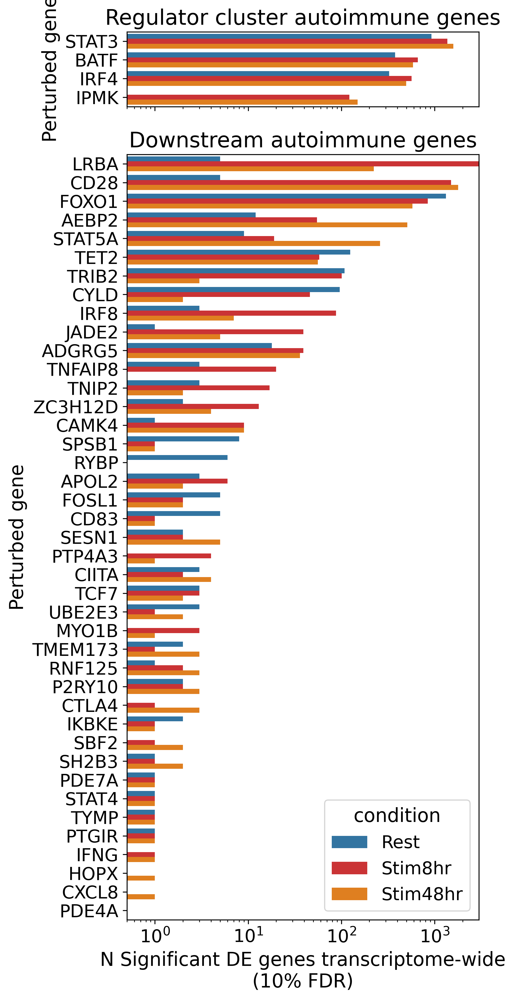

In [ ]:
condition_order = ['Rest', 'Stim8hr', 'Stim48hr']

# Calculate subplot heights based on number of unique genes
upstream_genes = de_summary_stats[de_summary_stats['target_name_corrected'].isin(perturbed)]
upstream_genes['n_total_de_genes'] = np.where(upstream_genes['n_total_de_genes']==0, 0.5, upstream_genes['n_total_de_genes'])
downstream_genes = de_summary_stats[de_summary_stats['target_name_corrected'].isin(positive + negative)]
downstream_genes['n_total_de_genes'] = np.where(downstream_genes['n_total_de_genes']==0, 0.5, downstream_genes['n_total_de_genes'])

n_upstream = len(upstream_genes['target_name_corrected'].unique())
n_downstream = len(downstream_genes['target_name_corrected'].unique())

# Create figure with proportional subplot heights
total_height = 12
height_ratio = n_downstream / n_upstream
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, total_height), 
                                gridspec_kw={'height_ratios': [1, height_ratio]},
                                sharex=True
                                )
## Upstream genes
pl_df = upstream_genes.sort_values('n_total_de_genes', ascending=False)
pl_df['condition'] = pd.Categorical(pl_df['condition'], categories=condition_order, ordered=True)
pl_df = pl_df.sort_values(['n_total_de_genes', 'condition'], ascending=[False, True])

sns.barplot(data=pl_df, x='n_total_de_genes', y='target_name_corrected', 
            hue='condition', palette=palettes['culture_condition'], 
            ax=ax1, hue_order=condition_order, legend=False)
for patch in ax1.patches:
    patch.set_rasterized(True)

ax1.set_xlim(0.5, pl_df['n_total_de_genes'].max())
ax1.set_xscale('log')
ax1.set_xlabel('N Significant DE genes (10% FDR)')
ax1.set_ylabel('Perturbed gene')
ax1.set_title('Regulator cluster autoimmune genes')

## Downstream genes
pl_df = downstream_genes.sort_values('n_total_de_genes', ascending=False)
pl_df['condition'] = pd.Categorical(pl_df['condition'], categories=condition_order, ordered=True)
pl_df = pl_df.sort_values(['n_total_de_genes', 'condition'], ascending=[False, True])

sns.barplot(data=pl_df, x='n_total_de_genes', y='target_name', 
            hue='condition', palette=palettes['culture_condition'], 
            ax=ax2, hue_order=condition_order)
for patch in ax2.patches:
    patch.set_rasterized(True)

ax2.set_xscale('log')
ax2.set_xlabel('N Significant DE genes transcriptome-wide\n(10% FDR)')
ax2.set_ylabel('Perturbed gene')
ax2.set_title('Downstream autoimmune genes')
ax2.set_xlim(0.5, pl_df['n_total_de_genes'].max())

plt.tight_layout()

plt.savefig(f'../results/diseasegenes_barplots_cluster{cluster}.svg', dpi=300,format='svg')

<Axes: xlabel='baseMean', ylabel='gene_name'>

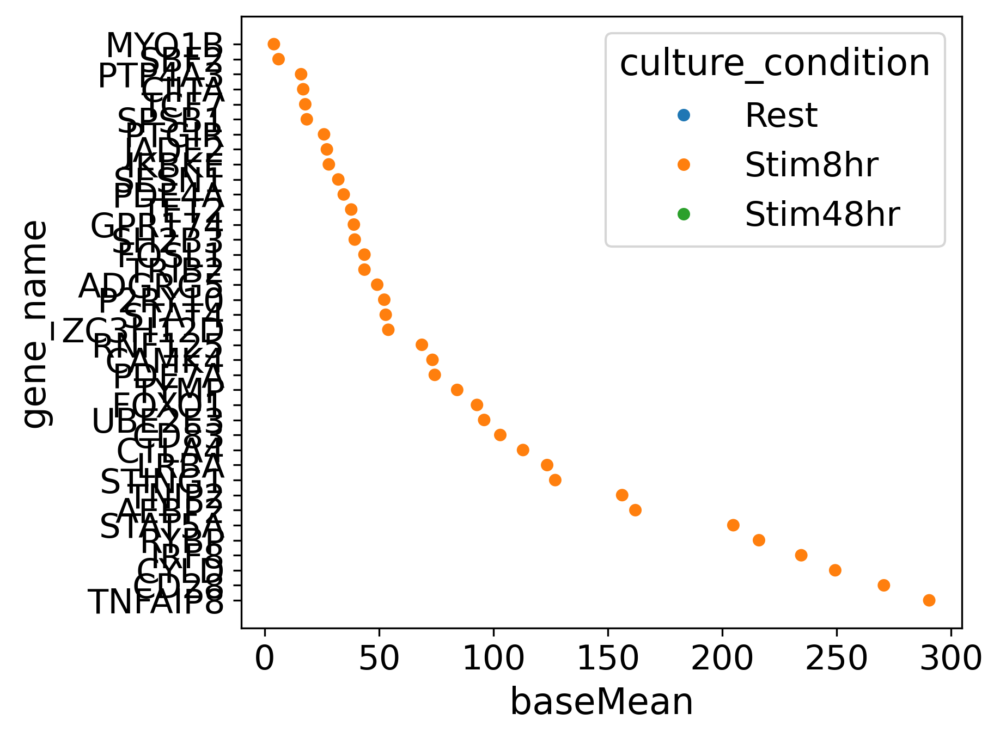

In [127]:
pl_df = get_DE_results_long(adata_de, targets=['IRF4'], genes=positive+negative, effect_estimates = ['zscore', 'log_fc', 'baseMean'])
pl_df = pl_df[pl_df['culture_condition'] == 'Stim8hr'].sort_values('baseMean')
sns.scatterplot(data=pl_df[pl_df.gene_name != 'IFNG'], y='gene_name', x='baseMean', hue='culture_condition')

In [130]:
de_summary_stats[de_summary_stats['target_name'] == 'PDE7A']

,Unnamed: 0,target_contrast,target_name,condition,n_cells_target,n_up_genes,n_down_genes,n_total_de_genes,ontarget_effect_size,ontarget_significant,baseMean,offtarget_flag,n_total_genes_category,ontarget_effect_category,target_contrast_corrected,obs_names,target_name_corrected
6233,6234,ENSG00000205268,PDE7A,Stim8hr,796.0,0,1,1,-11.271493,True,74.160359,False,1 DE gene,on-target KD,ENSG00000205268,ENSG00000205268_Stim8hr,PDE7A
13582,13584,ENSG00000205268,PDE7A,Stim48hr,838.0,0,1,1,-9.645608,True,124.187194,False,1 DE gene,on-target KD,ENSG00000205268,ENSG00000205268_Stim48hr,PDE7A
31663,31666,ENSG00000205268,PDE7A,Rest,778.0,0,1,1,-10.233216,True,118.984528,False,1 DE gene,on-target KD,ENSG00000205268,ENSG00000205268_Rest,PDE7A


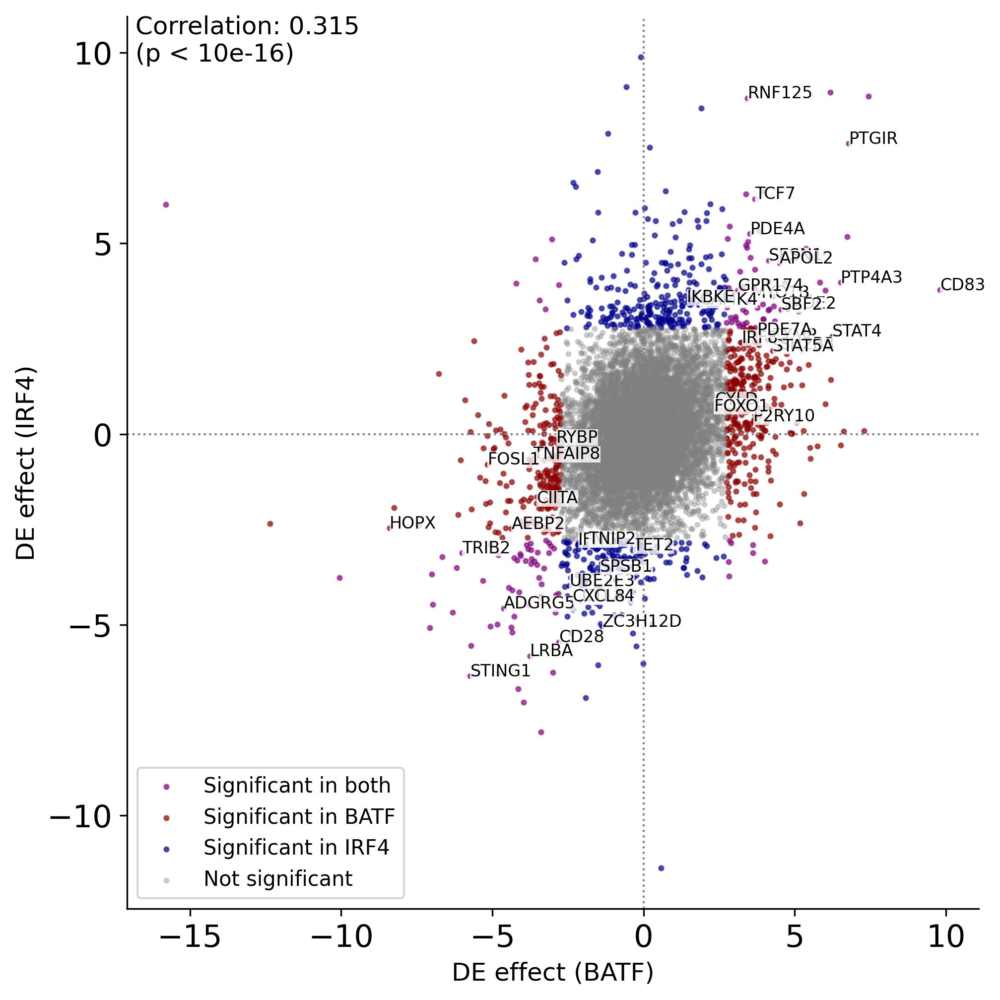

In [431]:
fig, ax = plt.subplots(figsize=(7, 7))
pl = plot_effect_comparison(
    adata_de, 
    {'target_contrast_gene_name':['BATF', 'IRF4'], 'stat':['zscore'], 'culture_condition':['Stim8hr']},
    annotate_significant=True, n_top_genes=10, plot_correlation=True, 
    annotate_genes = positive + negative,
    ax=ax
    )
ax.set_title('')
sns.despine()

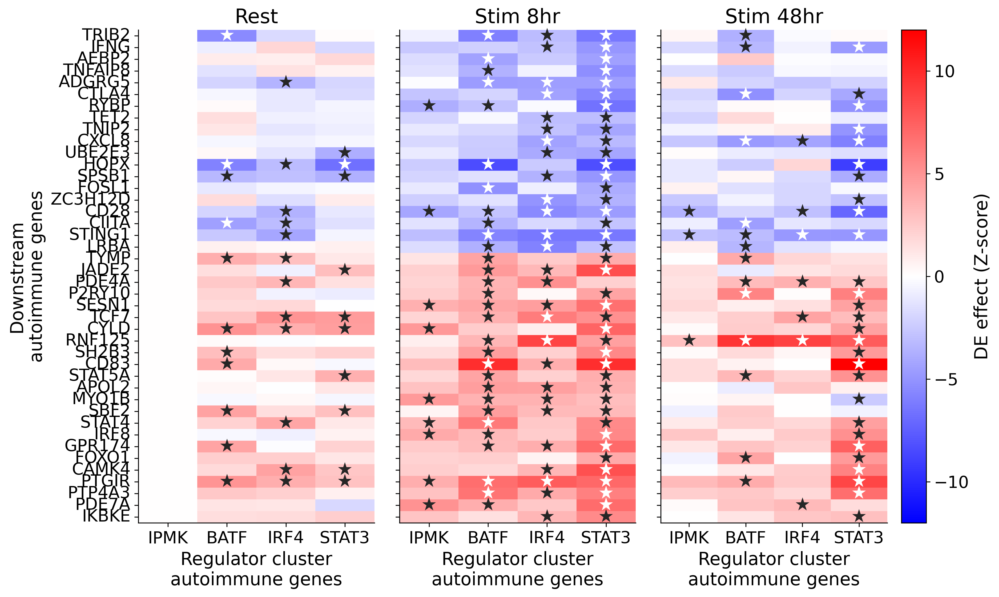

In [ ]:
filtered_df = get_DE_results_long(adata_de, targets=perturbed, genes=positive+negative)

# Create pivot tables with explicit index and columns to ensure same shape
rest_pl_df = filtered_df[filtered_df['culture_condition'] == 'Rest'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='zscore'
).reindex(index=positive+negative, columns=perturbed).fillna(0)

stim8hr_pl_df = filtered_df[filtered_df['culture_condition'] == 'Stim8hr'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='zscore'
).reindex(index=positive+negative, columns=perturbed).fillna(0)

stim48hr_pl_df = filtered_df[filtered_df['culture_condition'] == 'Stim48hr'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='zscore'
).reindex(index=positive+negative, columns=perturbed).fillna(0)

# Create significance mask
rest_sig_mask = filtered_df[filtered_df['culture_condition'] == 'Rest'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='significant'
).reindex(index=positive+negative, columns=perturbed).fillna(False)

stim8hr_sig_mask = filtered_df[filtered_df['culture_condition'] == 'Stim8hr'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='significant'
).reindex(index=positive+negative, columns=perturbed).fillna(False)

stim48hr_sig_mask = filtered_df[filtered_df['culture_condition'] == 'Stim48hr'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='significant'
).reindex(index=positive+negative, columns=perturbed).fillna(False)

# Create figure with 1 row and 3 columns
y_labelsize = 10
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(13,8), sharey=True, gridspec_kw={'wspace':0.1, 'width_ratios':[1,1,1.2]})

# Rest condition heatmap
sns.heatmap(rest_pl_df, center=0, cmap='bwr', vmax=12, vmin=-12, cbar=False, xticklabels=True, yticklabels=True, ax=ax1,
            annot=rest_sig_mask.applymap(lambda x: '★' if x else ''), fmt='')
ax1.set_xlabel('')
ax1.set_ylabel('Downstream\nautoimmune genes')
ax1.set_xlabel(f'Regulator cluster\nautoimmune genes')
ax1.set_title('Rest')

# Stim8hr condition heatmap
sns.heatmap(stim8hr_pl_df, center=0, cmap='bwr', vmax=12, vmin=-12, cbar=False, xticklabels=True, yticklabels=True, ax=ax2, 
            annot=stim8hr_sig_mask.applymap(lambda x: '★' if x else ''), fmt='')
ax2.set_ylabel('')
ax2.set_xlabel(f'Regulator cluster\nautoimmune genes')
ax2.set_title('Stim 8hr')

# Stim48hr condition heatmap
sns.heatmap(stim48hr_pl_df, center=0, cmap='bwr', vmax=12, vmin=-12, cbar=False, xticklabels=True, yticklabels=True, ax=ax3, 
            annot=stim48hr_sig_mask.applymap(lambda x: '★' if x else ''), fmt='')
ax3.set_ylabel('')
ax3.set_xlabel(f'Regulator cluster\nautoimmune genes')
ax3.set_title('Stim 48hr')
ax3.figure.colorbar(ax3.collections[0], ax=ax3, label='DE effect (Z-score)')

sns.despine()
plt.tight_layout()
plt.savefig(f'../results/diseasegenes_effect_heatmap_cluster{cluster}.pdf')


### Cluster 80 - Inflammatory function

In [ ]:
enrichment_df[enrichment_df['cluster'] == '80'].sort_values()

,odds_ratio,p_value,ci_low,ci_high,cluster_size,in_cluster_in_disease,in_cluster_not_disease,not_cluster_in_disease,not_cluster_not_disease,intersecting_genes,cluster,disease,p_adj_fdr,gene_set
300,1.429063,0.423606,0.163591,5.738634,41,2,39,63,1756,"[EGR2, RASA2]",80,Crohn's disease,0.465966,regulators
301,2.235871,0.170280,0.429947,7.355151,41,3,38,62,1757,"[BHLHE40, EGR2, BRD1]",80,ankylosing spondylitis,0.264822,regulators
302,1.745820,0.187177,0.526041,4.567531,41,5,36,134,1685,"[EGR2, BCL3, TBX21, KLF2, STAT5B]",80,asthma,0.264822,regulators
303,4.160648,0.022502,1.034566,12.308176,41,4,37,46,1773,"[TBX21, FLI1, EGR2, BHLHE40]",80,atopic eczema,0.082506,regulators
304,2.355680,0.011127,1.128559,4.712525,41,14,27,328,1491,"[BRD1, LRRC25, FLI1, EGR2, FBXO11, RASA2, TBX2...",80,autoimmune disease,0.061200,regulators
306,0.925323,0.636969,0.180519,2.973556,41,3,38,143,1676,"[EGR2, BRD1, RASA2]",80,inflammatory bowel disease,0.636969,regulators
307,2.095725,0.192598,0.403616,6.876823,41,3,38,66,1753,"[FLI1, EGR2, LRRC25]",80,psoriasis,0.264822,regulators
308,2.001123,0.129774,0.601747,5.250577,41,5,36,118,1701,"[BRD1, EGR2, FBXO11, CNOT4, BHLHE40]",80,rheumatoid arthritis,0.264822,regulators
309,4.545958,0.004182,1.510080,11.445978,41,6,35,66,1753,"[LRRC25, FLI1, EGR2, KLF2, IMMP1L, FAM20B]",80,systemic lupus erythematosus,0.046001,regulators
310,2.116855,0.261070,0.240024,8.651185,41,2,39,43,1776,"[FLI1, EGR2]",80,type 1 diabetes mellitus,0.319085,regulators


In [133]:

cl = '80'
print(corum_enrichment[(corum_enrichment['cluster'] == int(cl)) & (corum_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(kegg_enrichment[(kegg_enrichment['cluster'] == int(cl)) & (kegg_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(reactome_enrichment[(reactome_enrichment['cluster'] == int(cl)) & (reactome_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])

print(corum_down_enrichment[(corum_down_enrichment['cluster'] == int(cl)) & (corum_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(kegg_down_enrichment[(kegg_down_enrichment['cluster'] == int(cl)) & (kegg_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(reactome_down_enrichment[(reactome_down_enrichment['cluster'] == int(cl)) & (reactome_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])

             complex       overlap_genes  raw_p_value
483  Exocyst complex  ['EXOC4', 'EXOC7']     0.012207
Empty DataFrame
Columns: [complex, overlap_genes, raw_p_value]
Index: []
Empty DataFrame
Columns: [complex, overlap_genes, raw_p_value]
Index: []
                                       complex       overlap_genes  \
550              RasGAP-AURKA-survivin complex  ['AURKA', 'BIRC5']   
551  AKAP13-MAP2K3-MAP3K20-MAPK14-PKN1 complex  ['MAP2K3', 'PKN1']   
553              IFNG-KPNA1-STAT1alpha complex   ['STAT1', 'IFNG']   

     raw_p_value  
550     0.001556  
551     0.005032  
553     0.001556  
Empty DataFrame
Columns: [complex, overlap_genes, raw_p_value]
Index: []
                                                complex  \
8386       REACTOME_CHEMOKINE_RECEPTORS_BIND_CHEMOKINES   
8392       REACTOME_CYTOKINE_SIGNALING_IN_IMMUNE_SYSTEM   
8403           REACTOME_G2_M_DNA_REPLICATION_CHECKPOINT   
8404  REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_ST...   
8417            REACT

In [517]:
reactome_down_enrichment[(reactome_down_enrichment['cluster'] == int(cl)) & (reactome_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']]

,complex,overlap_genes,raw_p_value
8386,REACTOME_CHEMOKINE_RECEPTORS_BIND_CHEMOKINES,"['CXCL8', 'CCL4', 'CCL1', 'CCL3']",0.041432
8392,REACTOME_CYTOKINE_SIGNALING_IN_IMMUNE_SYSTEM,"['EDARADD', 'FLNA', 'CCL4', 'STAT1', 'GBP1', '...",0.029588
8403,REACTOME_G2_M_DNA_REPLICATION_CHECKPOINT,"['CCNB2', 'CCNA2']",0.010254
8404,REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_ST...,"['MIF', 'HNRNPDL', 'IFNG', 'ANXA2']",0.010772
8417,REACTOME_IFNG_SIGNALING_ACTIVATES_MAPKS,"['JAK2', 'IFNG']",0.013468
8425,REACTOME_INTERFERON_GAMMA_SIGNALING,"['GBP1', 'JAK2', 'GBP5', 'STAT1', 'IFNG', 'GBP...",0.006986
8427,REACTOME_INTERLEUKIN_10_SIGNALING,"['CSF1', 'CCL4', 'CXCL8', 'CCL3']",0.019242
8428,REACTOME_INTERLEUKIN_12_FAMILY_SIGNALING,"['MIF', 'JAK2', 'HNRNPDL', 'ANXA2', 'STAT1', '...",0.001811
8429,REACTOME_INTERLEUKIN_12_SIGNALING,"['MIF', 'JAK2', 'HNRNPDL', 'ANXA2', 'IFNG']",0.004196
8431,REACTOME_INTERLEUKIN_20_FAMILY_SIGNALING,"['STAT1', 'IL22', 'JAK2']",0.021062


In [518]:
cluster = '80'
de_effects = get_DE_results_long(adata_de, enr_cluster_autoimmune_members[cluster])
de_effects = de_effects[de_effects['culture_condition'] == condition]
de_effects[de_effects['gene_name'] == 'CXCL8']

,index,gene,log_fc,zscore,adj_p_value,significant,gene_name,culture_condition,target_contrast,target_contrast_gene_name


In [519]:
get_DE_results_long(adata_de, targets=['LRRC25'], effect_estimates= ['baseMean', 'log_fc']).sort_values('adj_p_value')[0:30]

,index,gene,baseMean,log_fc,adj_p_value,significant,gene_name,culture_condition,target_contrast,target_contrast_gene_name
29845,ENSG00000175489_Stim8hr,UBE2R2,200.629761,-1.899130,1.284817e-184,True,UBE2R2,Stim8hr,ENSG00000175489,LRRC25
19563,ENSG00000175489_Stim48hr,UBE2R2,373.259931,-1.335017,3.632783e-133,True,UBE2R2,Stim48hr,ENSG00000175489,LRRC25
9281,ENSG00000175489_Rest,UBE2R2,137.222882,-1.897346,7.563488e-130,True,UBE2R2,Rest,ENSG00000175489,LRRC25
20040,ENSG00000175489_Stim48hr,ZDHHC13,60.243086,-2.210466,2.972274e-69,True,ZDHHC13,Stim48hr,ENSG00000175489,LRRC25
30322,ENSG00000175489_Stim8hr,ZDHHC13,52.417279,-2.727827,3.566061e-69,True,ZDHHC13,Stim8hr,ENSG00000175489,LRRC25
19749,ENSG00000175489_Stim48hr,VEGFA,84.324123,-3.378650,5.733267e-66,True,VEGFA,Stim48hr,ENSG00000175489,LRRC25
9758,ENSG00000175489_Rest,ZDHHC13,44.933616,-2.228731,5.574182e-51,True,ZDHHC13,Rest,ENSG00000175489,LRRC25
24052,ENSG00000175489_Stim8hr,GRAMD1A,110.600369,-2.516914,1.275462e-47,True,GRAMD1A,Stim8hr,ENSG00000175489,LRRC25
9603,ENSG00000175489_Rest,WWOX,35.716149,-3.941570,2.542680e-46,True,WWOX,Rest,ENSG00000175489,LRRC25
4080,ENSG00000175489_Rest,IQSEC1,97.459373,-1.546915,1.579417e-45,True,IQSEC1,Rest,ENSG00000175489,LRRC25


In [520]:
downstream_enrichment_df[(downstream_enrichment_df['cluster'] == '80')]

,odds_ratio,p_value,ci_low,ci_high,cluster_size,in_cluster_in_disease,in_cluster_not_disease,not_cluster_in_disease,not_cluster_not_disease,intersecting_genes,cluster,disease,p_adj_fdr,gene_set
702,0.673606,0.819300,0.134913,2.068663,100,3,97,144,3136,"[FASLG, IFNG, JAK2]",80,Crohn's disease,0.877791,downstream
703,0.806043,0.711841,0.094635,3.086736,100,2,98,81,3199,"[RPIA, EDARADD]",80,Hashimoto's thyroiditis,0.877791,downstream
704,2.286994,0.233117,0.260823,9.260050,100,2,98,29,3251,"[NUDC, NLRC5]",80,age-related macular degeneration,0.877791,downstream
705,1.001590,0.572209,0.263468,2.711682,100,4,96,131,3149,"[JAK2, LMO4, GRAMD1B, IFNG]",80,ankylosing spondylitis,0.877791,downstream
706,0.850452,0.706090,0.301090,1.951226,100,6,94,229,3051,"[ADAM19, RIN3, JAK2, PHB1, ANXA2, FASLG]",80,asthma,0.877791,downstream
707,1.162467,0.486663,0.231004,3.617451,100,3,97,85,3195,"[FASLG, IL22, SLAMF1]",80,atopic eczema,0.877791,downstream
708,1.079675,0.419399,0.628641,1.780915,100,21,79,648,2632,"[C12orf75, RIN3, GRAMD1B, DOCK9, ATAD3B, SEH1L...",80,autoimmune disease,0.877791,downstream
709,2.585403,0.082256,0.665649,7.242416,100,4,96,52,3228,"[FASLG, STAT1, NLRC5, PHB1]",80,celiac disease,0.758695,downstream
710,1.623506,0.101159,0.771225,3.102991,100,11,89,232,3048,"[ADAM19, TSPAN2, PSTPIP1, CXCL8, DOCK9, PHB1, ...",80,coronary artery disease,0.758695,downstream
711,0.703127,0.846432,0.249333,1.609513,100,6,94,273,3007,"[C12orf75, JAK2, ATAD3B, IFNG, SEH1L, FASLG]",80,inflammatory bowel disease,0.877791,downstream


In [521]:
np.setdiff1d(positive+negative,downstream_enrichment_df[(downstream_enrichment_df['cluster'] == '80')].iloc[5]['intersecting_genes'])

array(['AGPAT2', 'AHI1', 'APBB1IP', 'APOBR', 'ARHGEF12', 'ATF7IP', 'CCR5',
       'CD28', 'CD55', 'CD63', 'CUX1', 'DIPK1A', 'DOCK5', 'DPF3', 'F5',
       'FKBP5', 'FYB1', 'FYN', 'GNG2', 'GRAP2', 'GSE1', 'ICOS', 'IER5L',
       'IL10RA', 'IL12RB2', 'ITGA1', 'ITK', 'JAK2', 'LEF1', 'LSP1',
       'MBNL1', 'NCF4', 'PDK1', 'RASSF3', 'SATB1', 'SELL', 'SEPTIN9',
       'STMN3', 'TMEM131L', 'TTYH3'], dtype='<U8')

In [522]:
enr_perturbed = enrichment_df[(enrichment_df['cluster'] == '80') & (enrichment_df.disease == 'autoimmune disease')]['intersecting_genes'].iloc[0]


Figure saved to ./results/diseasegenes_viz_cluster80.pdf


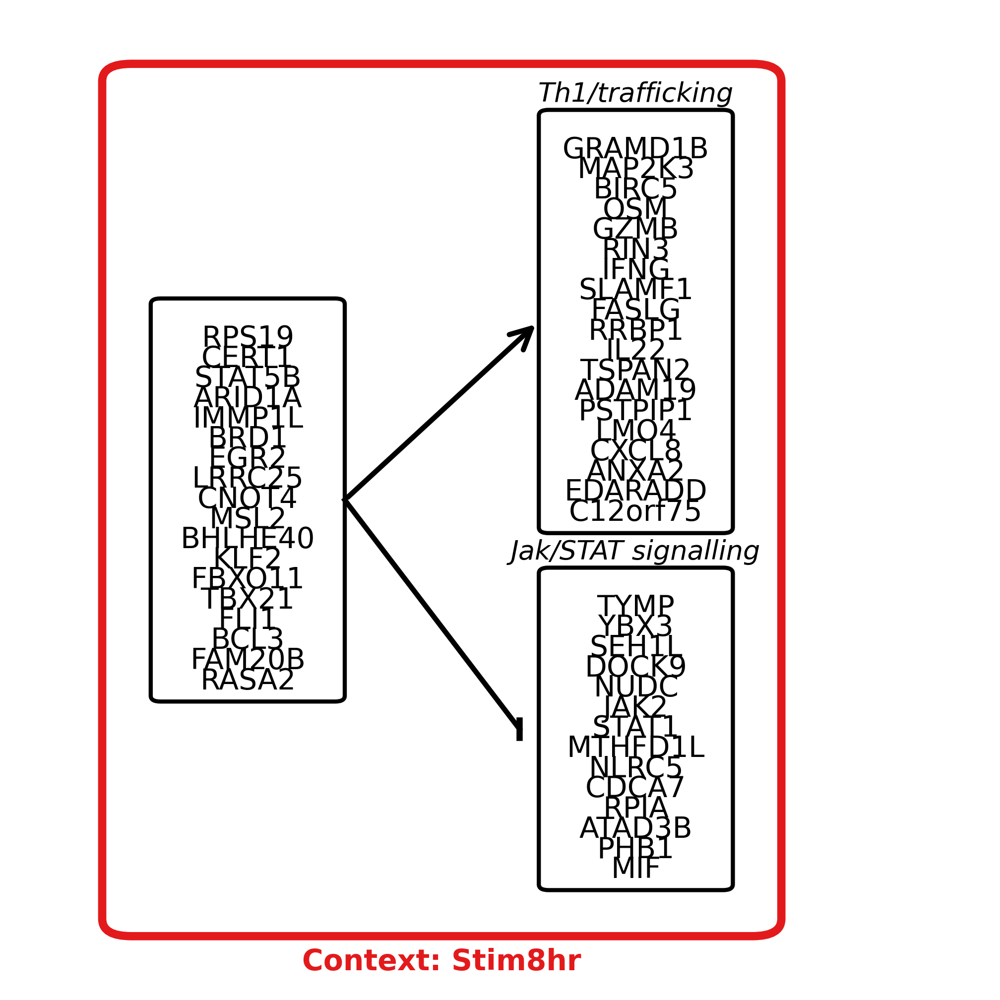

In [ ]:
cluster = '80'
condition = cluster2condition['condition_label'].loc[cluster]
perturbed = enr_cluster_autoimmune_members[cluster]
positive = enr_cluster_autoimmune_downstream[cluster][enr_cluster_autoimmune_downstream[cluster] == -1].index.tolist()
negative = enr_cluster_autoimmune_downstream[cluster][enr_cluster_autoimmune_downstream[cluster] == 1].index.tolist()
fig, ax = plot_gene_perturbation(
        perturbed_genes=perturbed,
        positive_genes=positive,
        negative_genes=negative,
        highlight_genes=None,  # Optional: highlight some genes
        context_label=condition,
        context_color=palettes['culture_condition'][condition],
        positive_label="Th1/trafficking",
        negative_label="Jak/STAT signalling",
        figsize=(7,7),
        save_path = f'../results/diseasegenes_viz_cluster{cluster}.pdf'
    )


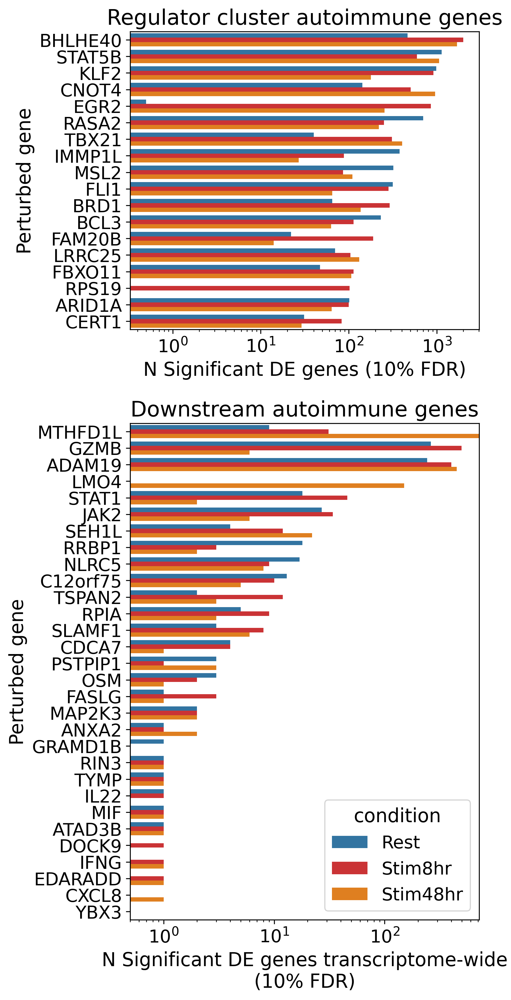

In [ ]:
condition_order = ['Rest', 'Stim8hr', 'Stim48hr']

# Calculate subplot heights based on number of unique genes
upstream_genes = de_summary_stats[de_summary_stats['target_name_corrected'].isin(perturbed)]
upstream_genes['n_total_de_genes'] = np.where(upstream_genes['n_total_de_genes']==0, 0.5, upstream_genes['n_total_de_genes'])
downstream_genes = de_summary_stats[de_summary_stats['target_name_corrected'].isin(positive + negative)]
downstream_genes['n_total_de_genes'] = np.where(downstream_genes['n_total_de_genes']==0, 0.5, downstream_genes['n_total_de_genes'])

n_upstream = len(upstream_genes['target_name_corrected'].unique())
n_downstream = len(downstream_genes['target_name_corrected'].unique())

# Create figure with proportional subplot heights
total_height = 12
height_ratio = n_downstream / n_upstream
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, total_height), 
                                gridspec_kw={'height_ratios': [1, height_ratio]},
                                sharex=False
                                )
## Upstream genes
pl_df = upstream_genes.sort_values('n_total_de_genes', ascending=False)
pl_df['condition'] = pd.Categorical(pl_df['condition'], categories=condition_order, ordered=True)
pl_df = pl_df.sort_values(['n_total_de_genes', 'condition'], ascending=[False, True])

sns.barplot(data=pl_df, x='n_total_de_genes', y='target_name_corrected', 
            hue='condition', palette=palettes['culture_condition'], 
            ax=ax1, hue_order=condition_order, legend=False)
for patch in ax1.patches:
    patch.set_rasterized(True)

# ax1.set_xlim(0.5, pl_df['n_total_de_genes'].max())
ax1.set_xscale('log')
ax1.set_xlabel('N Significant DE genes (10% FDR)')
ax1.set_ylabel('Perturbed gene')
ax1.set_title('Regulator cluster autoimmune genes')

## Downstream genes
pl_df = downstream_genes.sort_values('n_total_de_genes', ascending=False)
pl_df['condition'] = pd.Categorical(pl_df['condition'], categories=condition_order, ordered=True)
pl_df = pl_df.sort_values(['n_total_de_genes', 'condition'], ascending=[False, True])

sns.barplot(data=pl_df, x='n_total_de_genes', y='target_name', 
            hue='condition', palette=palettes['culture_condition'], 
            ax=ax2, hue_order=condition_order)
for patch in ax2.patches:
    patch.set_rasterized(True)

ax2.set_xscale('log')
ax2.set_xlabel('N Significant DE genes transcriptome-wide\n(10% FDR)')
ax2.set_ylabel('Perturbed gene')
ax2.set_title('Downstream autoimmune genes')
ax2.set_xlim(0.5, pl_df['n_total_de_genes'].max())

plt.tight_layout()

plt.savefig(f'../results/diseasegenes_barplots_cluster{cluster}.svg', dpi=300,format='svg')

In [527]:
upstream_genes[upstream_genes['target_name'] == 'FAM20B']

,Unnamed: 0,target_contrast,target_name,condition,n_cells_target,n_up_genes,n_down_genes,n_total_de_genes,ontarget_effect_size,ontarget_significant,baseMean,offtarget_flag,n_total_genes_category,ontarget_effect_category,target_contrast_corrected,obs_names,target_name_corrected
1863,1864,ENSG00000116199,FAM20B,Stim8hr,376.0,73,116,189.0,-10.800103,True,34.269894,False,>10 DE genes,on-target KD,ENSG00000116199,ENSG00000116199_Stim8hr,FAM20B
3555,3556,ENSG00000116199,FAM20B,Stim48hr,403.0,8,6,14.0,-11.069144,True,29.513726,False,>10 DE genes,on-target KD,ENSG00000116199,ENSG00000116199_Stim48hr,FAM20B
10048,10050,ENSG00000116199,FAM20B,Rest,373.0,15,7,22.0,-7.251744,True,18.866421,False,>10 DE genes,on-target KD,ENSG00000116199,ENSG00000116199_Rest,FAM20B


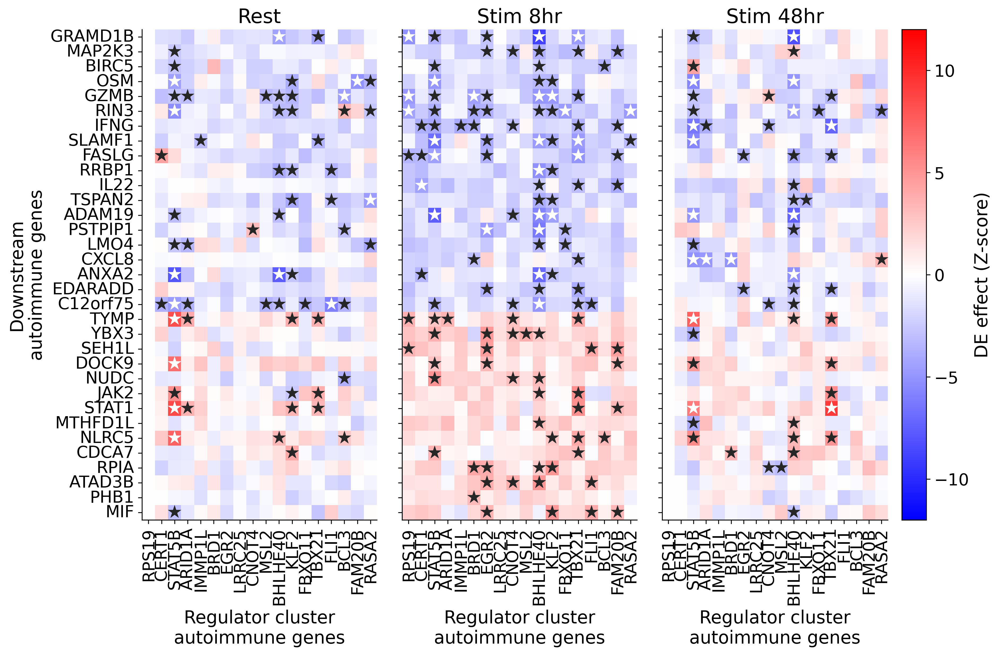

In [ ]:
filtered_df = get_DE_results_long(adata_de, targets=perturbed, genes=positive+negative)

# Create pivot tables with explicit index and columns to ensure same shape
rest_pl_df = filtered_df[filtered_df['culture_condition'] == 'Rest'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='zscore'
).reindex(index=positive+negative, columns=perturbed).fillna(0)

stim8hr_pl_df = filtered_df[filtered_df['culture_condition'] == 'Stim8hr'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='zscore'
).reindex(index=positive+negative, columns=perturbed).fillna(0)

stim48hr_pl_df = filtered_df[filtered_df['culture_condition'] == 'Stim48hr'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='zscore'
).reindex(index=positive+negative, columns=perturbed).fillna(0)

# Create significance mask
rest_sig_mask = filtered_df[filtered_df['culture_condition'] == 'Rest'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='significant'
).reindex(index=positive+negative, columns=perturbed).fillna(False)

stim8hr_sig_mask = filtered_df[filtered_df['culture_condition'] == 'Stim8hr'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='significant'
).reindex(index=positive+negative, columns=perturbed).fillna(False)

stim48hr_sig_mask = filtered_df[filtered_df['culture_condition'] == 'Stim48hr'].pivot(
    index='gene_name', columns=['target_contrast_gene_name'], values='significant'
).reindex(index=positive+negative, columns=perturbed).fillna(False)

# Create figure with 1 row and 3 columns
y_labelsize = 10
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(13,8), sharey=True, gridspec_kw={'wspace':0.1, 'width_ratios':[1,1,1.2]})

# Rest condition heatmap
sns.heatmap(rest_pl_df, center=0, cmap='bwr', vmax=12, vmin=-12, cbar=False, xticklabels=True, yticklabels=True, ax=ax1,
            annot=rest_sig_mask.applymap(lambda x: '★' if x else ''), fmt='')
ax1.set_xlabel('')
ax1.set_ylabel('Downstream\nautoimmune genes')
ax1.set_xlabel(f'Regulator cluster\nautoimmune genes')
ax1.set_title('Rest')

# Stim8hr condition heatmap
sns.heatmap(stim8hr_pl_df, center=0, cmap='bwr', vmax=12, vmin=-12, cbar=False, xticklabels=True, yticklabels=True, ax=ax2, 
            annot=stim8hr_sig_mask.applymap(lambda x: '★' if x else ''), fmt='')
ax2.set_ylabel('')
ax2.set_xlabel(f'Regulator cluster\nautoimmune genes')
ax2.set_title('Stim 8hr')

# Stim48hr condition heatmap
sns.heatmap(stim48hr_pl_df, center=0, cmap='bwr', vmax=12, vmin=-12, cbar=False, xticklabels=True, yticklabels=True, ax=ax3, 
            annot=stim48hr_sig_mask.applymap(lambda x: '★' if x else ''), fmt='')
ax3.set_ylabel('')
ax3.set_xlabel(f'Regulator cluster\nautoimmune genes')
ax3.set_title('Stim 48hr')
ax3.figure.colorbar(ax3.collections[0], ax=ax3, label='DE effect (Z-score)')

sns.despine()
plt.tight_layout()
plt.savefig(f'../results/diseasegenes_effect_heatmap_cluster{cluster}.pdf')


In [ ]:
get_DE_results_long(adata_de, targets=['JAK2'], effect_estimates= ['baseMean', 'log_fc']).sort_values('adj_p_value')[0:30]

,index,gene,baseMean,log_fc,adj_p_value,significant,gene_name,culture_condition,target_contrast,target_contrast_gene_name
24731,ENSG00000096968_Stim8hr,JAK2,169.639430,-3.000924,3.587847e-102,True,JAK2,Stim8hr,ENSG00000096968,JAK2
4167,ENSG00000096968_Rest,JAK2,122.327866,-2.579397,7.041203e-83,True,JAK2,Rest,ENSG00000096968,JAK2
14449,ENSG00000096968_Stim48hr,JAK2,67.311804,-2.641079,1.456198e-82,True,JAK2,Stim48hr,ENSG00000096968,JAK2
23509,ENSG00000096968_Stim8hr,FAR1,131.448385,-0.550433,2.585729e-17,True,FAR1,Stim8hr,ENSG00000096968,JAK2
2945,ENSG00000096968_Rest,FAR1,79.616801,-0.531954,1.284917e-11,True,FAR1,Rest,ENSG00000096968,JAK2
27211,ENSG00000096968_Stim8hr,PSMB9,281.898727,-0.471931,2.039641e-10,True,PSMB9,Stim8hr,ENSG00000096968,JAK2
13227,ENSG00000096968_Stim48hr,FAR1,106.617145,-0.471691,3.049818e-09,True,FAR1,Stim48hr,ENSG00000096968,JAK2
29838,ENSG00000096968_Stim8hr,UBE2L6,203.628697,-0.452322,1.522557e-07,True,UBE2L6,Stim8hr,ENSG00000096968,JAK2
28968,ENSG00000096968_Stim8hr,TAP1,890.857102,-0.470933,1.522557e-07,True,TAP1,Stim8hr,ENSG00000096968,JAK2
8208,ENSG00000096968_Rest,STAT1,498.771561,-0.829411,2.825517e-07,True,STAT1,Rest,ENSG00000096968,JAK2


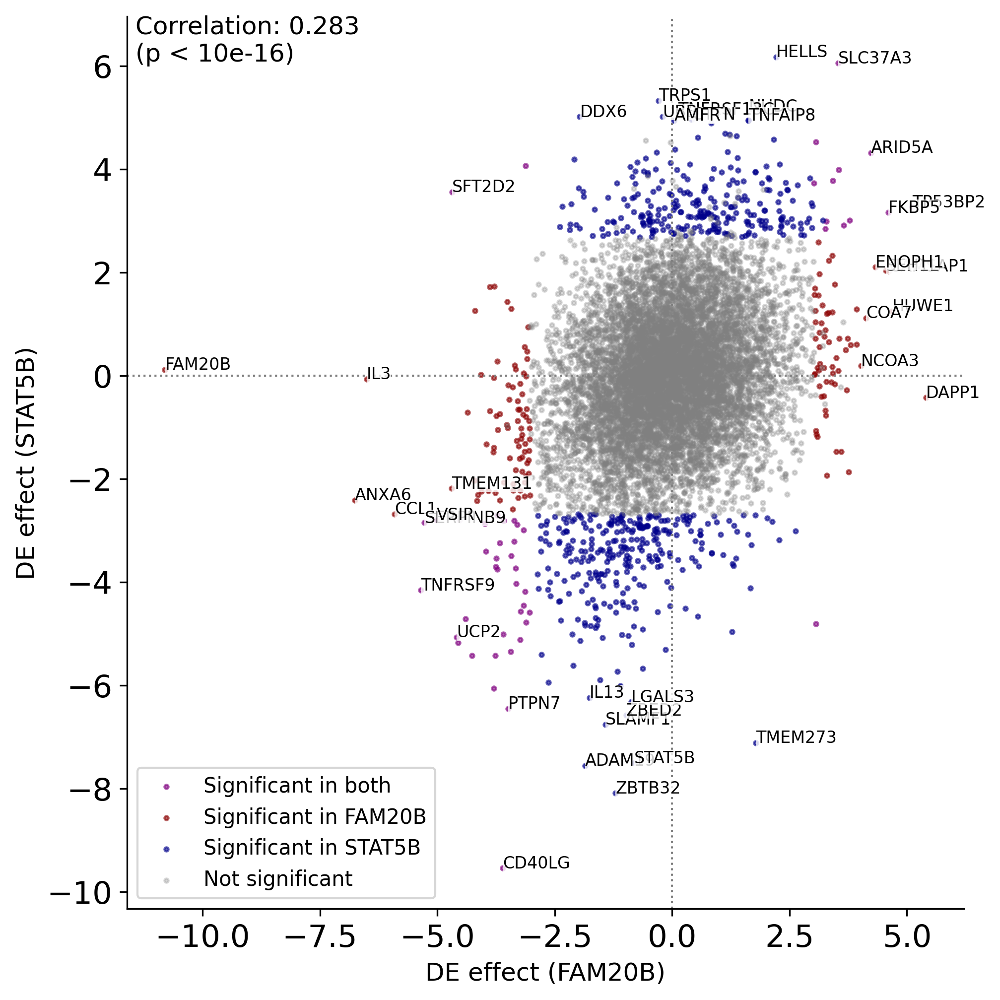

In [ ]:
fig, ax = plt.subplots(figsize=(7, 7))
pl = plot_effect_comparison(
    adata_de, 
    {'target_contrast_gene_name':['STAT5B', 'FAM20B'], 'stat':['zscore'], 'culture_condition':['Stim8hr']},
    annotate_significant=True, n_top_genes=10, plot_correlation=True, 
    # annotate_genes = ['KLF2', 'STAT5B'],
    ax=ax
    )
ax.set_title('')
sns.despine()

### Cluster 82

no erncihment in the members, but enrichment in the downstream

In [ ]:

cl = '82'
print(corum_enrichment[(corum_enrichment['cluster'] == int(cl)) & (corum_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(kegg_enrichment[(kegg_enrichment['cluster'] == int(cl)) & (kegg_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(reactome_enrichment[(reactome_enrichment['cluster'] == int(cl)) & (reactome_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])

print(corum_down_enrichment[(corum_down_enrichment['cluster'] == int(cl)) & (corum_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(kegg_down_enrichment[(kegg_down_enrichment['cluster'] == int(cl)) & (kegg_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])
print(reactome_down_enrichment[(reactome_down_enrichment['cluster'] == int(cl)) & (reactome_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']])

Empty DataFrame
Columns: [complex, overlap_genes, raw_p_value]
Index: []
Empty DataFrame
Columns: [complex, overlap_genes, raw_p_value]
Index: []
Empty DataFrame
Columns: [complex, overlap_genes, raw_p_value]
Index: []
                                       complex       overlap_genes  \
482               CD44-ERK1-ERK2-RHAMM complex    ['CD44', 'HMMR']   
483  IL-2 receptor-IL-2 complex, high affinity  ['IL2RA', 'IL2RB']   
484                          CCR2-CCR5 complex    ['CCR2', 'CCR5']   

     raw_p_value  
482     0.003065  
483     0.003065  
484     0.000527  
                                            complex  \
977                        KEGG_ALLOGRAFT_REJECTION   
979                 KEGG_AUTOIMMUNE_THYROID_DISEASE   
983     KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION   
988                 KEGG_HEMATOPOIETIC_CELL_LINEAGE   
990                 KEGG_JAK_STAT_SIGNALING_PATHWAY   
993  KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY   

                                      

In [ ]:
clustering_df[clustering_df['cluster'] == cl]

,hdbscan,target_contrast_gene_name_corrected,cluster,culture_condition
_index,,,,
ENSG00000055609_Stim48hr,82,KMT2C,82,Stim48hr
ENSG00000126012_Stim8hr,82,KDM5C,82,Stim8hr
ENSG00000100385_Stim8hr,82,IL2RB,82,Stim8hr
ENSG00000011590_Stim48hr,82,ZBTB32,82,Stim48hr
ENSG00000113716_Stim48hr,82,HMGXB3,82,Stim48hr
ENSG00000102265_Stim48hr,82,TIMP1,82,Stim48hr
ENSG00000182963_Stim48hr,82,GJC1,82,Stim48hr


In [ ]:
reactome_down_enrichment[(reactome_down_enrichment['cluster'] == int(cl)) & (reactome_down_enrichment.raw_p_value < 0.05)][['complex', 'overlap_genes', 'raw_p_value']]

,complex,overlap_genes,raw_p_value
7164,REACTOME_CHEMOKINE_RECEPTORS_BIND_CHEMOKINES,"['CCR5', 'CCR2', 'CCR1', 'CCL3']",0.041432
7181,REACTOME_HYALURONAN_UPTAKE_AND_DEGRADATION,"['CD44', 'HMMR']",0.029899
7188,REACTOME_INTERLEUKIN_10_SIGNALING,"['CSF1', 'CCR1', 'CCR5', 'CCR2', 'CCL3', 'CSF2']",0.000508
7191,REACTOME_INTERLEUKIN_21_SIGNALING,"['STAT4', 'IL21R']",0.021004
7192,REACTOME_INTERLEUKIN_2_FAMILY_SIGNALING,"['IL2RB', 'STAT4', 'IL21R', 'IL2RA', 'CSF2']",0.003137
7193,REACTOME_INTERLEUKIN_2_SIGNALING,"['IL2RA', 'IL2RB']",0.029899
7196,REACTOME_INTERLEUKIN_RECEPTOR_SHC_SIGNALING,"['IL2RA', 'CSF2', 'IL2RB']",0.023306
7220,REACTOME_RUNX1_AND_FOXP3_CONTROL_THE_DEVELOPME...,"['IL2RA', 'IFNG']",0.021004


### Cluster 82

no erncihment in the members, but enrichment in the downstream

## Check genetic associations for follow-up hits in curation from Minikel et al. 

In [459]:
minikel_tab = pd.read_table('assoc.tsv.gz')

minikel_tab[
    (minikel_tab['gene'] == "FAM20B") 
    # & 
    # (minikel_tab['original_trait'].str.contains('sthma', case=False))
]

,arow,gene,mesh_id,source,original_trait,original_link,extra_info,l2g_rank,l2g_share,pval,year,beta,odds_ratio,pic_qtl_pval,pic_h4,af_gnomad_nfe,mesh_term
140102,172417,FAM20B,D001827,OTG,Height,https://genetics.opentargets.org/study/GCST007841,NaN,1.0,0.60,3.000000e-09,2018.0,NaN,NaN,NaN,NaN,0.514050,Body Height
140103,172418,FAM20B,D001827,OTG,Height,https://genetics.opentargets.org/study/GCST900...,NaN,3.0,0.14,1.500000e-08,2021.0,-0.008802,NaN,NaN,NaN,0.591907,Body Height
140104,172419,FAM20B,D059289,OTG,Pulse wave arterial stiffness index,https://genetics.opentargets.org/study/NEALE2_...,NaN,2.0,0.28,3.878120e-10,2018.0,0.550599,NaN,NaN,NaN,0.010184,Vascular Stiffness


In [57]:
minikel_tab[
    (minikel_tab['gene'] == "COG6") & 
    (minikel_tab['original_trait'].str.contains('sthma', case=False))
].original_trait.unique()

array(['Asthma (adult onset)', 'Asthma'], dtype=object)